In [2]:
%load_ext autoreload
%autoreload 2

from itertools import product
from collections import defaultdict
import copy

import pandas as pd
import numpy as np
from scipy.stats import ttest_ind, ranksums

import plotnine as p9
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import MaxNLocator
import seaborn as sns

from predictability.utils import read_fasta
from predictability.constants import PROJECT_ROOT, DATA_ROOT, BINARY_RESIDUE_FEATURES
from predictability.plotting import assign_pretty_feature_names, color_mapping, feature_mapping, features_to_df_descriptors, plot_marginal_probabilities, df_descriptors_to_features

In [3]:
save_dir = PROJECT_ROOT / "results/figures"
save_dir.mkdir(exist_ok=True, parents=True)
np.random.seed(41)
amy_bacsu_reference = [sequence for key, sequence in read_fasta(DATA_ROOT / "AMY_BACSU/reference.fasta").items()][0]

In [4]:
def raw_data_to_long(data: pd.DataFrame):
    df_long = pd.melt(data, id_vars=["sequence", "stain_activity"], value_vars=["is_buried", "is_connected", "is_secondary", "is_close_to_as"], var_name="Feature", value_name="Feature label")
    df_long["Feature label"] = df_long["Feature label"].map(lambda x: ["Negative", "Positive"][x])
    df_long["Feature"] = df_long["Feature"].map(assign_pretty_feature_names)
    df_long["Structural characteristic"] = df_long[["Feature", "Feature label"]].apply(lambda x: feature_mapping[tuple(x)], axis=1)
    df_long["Structural characteristic"] = pd.Categorical(df_long["Structural characteristic"],
                                                         categories=["Buried", "Exposed", "Many contacts", "Few contacts",
                                                                     "Close to active site", "Distant to active site",
                                                                     "Part of helix or sheet", "Part of loop"],
                                                         ordered=True)
    return df_long

def format_predictability_results(results: pd.DataFrame):
    results["belongs"] = results["is_member"].astype(bool)
    results["Feature label"] = results["is_member"].apply(lambda x: "Negative" if x==False else "Positive")
    results["Feature"] = results["structural_characteristic"].apply(assign_pretty_feature_names)
    results = results.rename(columns={"spearman": "Test spearman"})
    results["Structural class"] = results[["Feature", "Feature label"]].apply(
        lambda x: feature_mapping[tuple(x)], axis=1
    )
    results["Structural class"] = pd.Categorical(results["Structural class"],
                                                         categories=["Buried", "Exposed", "Many contacts", "Few contacts",
                                                                     "Close to active site", "Distant to active site",
                                                                     "Part of helix or sheet", "Part of loop"],
                                                         ordered=True)
    return results

def extract_marginals_from_structural_characteristics(structural_characteristics: pd.DataFrame, sequence_length: int):
    p_matrix = np.empty((8, 8))
    for i, class_name_1 in enumerate(features_to_df_descriptors.keys()):
        for j, class_name_2 in enumerate(features_to_df_descriptors.keys()):
            residues_1 = structural_characteristics[
                structural_characteristics[features_to_df_descriptors[class_name_1][0]] == features_to_df_descriptors[class_name_1][1]
            ]["residue_number"]
            residues_2 = structural_characteristics[
                structural_characteristics[features_to_df_descriptors[class_name_2][0]] == features_to_df_descriptors[class_name_2][1]
            ]["residue_number"]
            intersection = set(residues_1).intersection(residues_2)
            p_matrix[i, j] = len(intersection) / sequence_length
    return p_matrix

def get_characteristic_medians(structural_characteristics):
    return {
        "Buriedness": np.quantile(structural_characteristics["buriedness"], q=0.5),
        "Number of contacts": np.quantile(structural_characteristics["contacts"], q=0.5),
        "Distance to the active site": np.quantile(structural_characteristics["distance_to_active_site"], q=0.5),
        "Part of helix or sheet": np.quantile(structural_characteristics["is_secondary"].map(int), q=0.5),
    }

def get_bin_to_code_mappings(bin_distributions, medians):
    bins_to_class_combinations = defaultdict(str)
    features_to_letter_code = {
        "Buriedness": {True: "B", False: "E"},
        "Number of contacts": {True: "C", False: "I"},
        "Distance to the active site": {True: "D", False: "P"},
        "Part of helix or sheet": {True: "S", False: "L"}
    }
    for var in bin_distributions["variable"].unique():
        median = medians[var]
        for bin_label in bin_distributions["bin"].unique():
            dd = bin_distributions[
                (bin_distributions["variable"] == var) &
                (bin_distributions["bin"] == bin_label)
            ]
            if var == "Number of contacts":
                bins_to_class_combinations[bin_label] += features_to_letter_code[var][all(dd["value"] > median)]
            else:
                bins_to_class_combinations[bin_label] += features_to_letter_code[var][all(dd["value"] >= median)]
    
    return bins_to_class_combinations

In [5]:
plt.rcParams["xtick.bottom"] = True
plt.rcParams["ytick.left"] = True

# 2.2 Beneficial and detrimental mutations are found everywhere

## Stain activity distribution of combinatorials by structural class

In [6]:
plot_name = "stain_activity_distributions"
data = pd.read_csv(DATA_ROOT / "AMY_BACSU/combinatorials/data.csv")
reference_stain_activity = data[data["sequence"] == amy_bacsu_reference]["stain_activity"]
df_long = raw_data_to_long(data)
df_long["Fill color"] = df_long["Structural characteristic"].apply(lambda x: color_mapping[x])

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 3.5 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/stain_activity_distributions.pdf


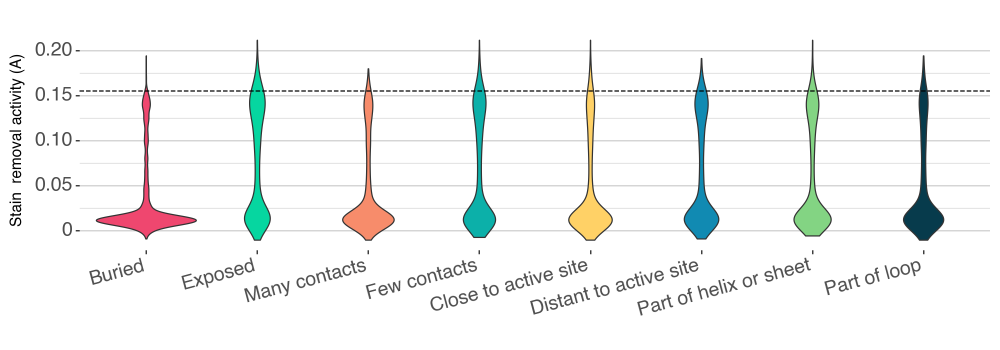

In [7]:
p = (
    p9.ggplot(df_long, p9.aes(x="Structural characteristic", y="stain_activity", fill="Structural characteristic"))
    + p9.geom_violin(position=p9.position_dodge(width=0.9), show_legend=False)
    + p9.geom_hline(yintercept=reference_stain_activity, color="k", linetype="dashed")
    + p9.scale_fill_manual(values=color_mapping)
    + p9.theme(
        figure_size=(10, 3.5),
        axis_text_x=p9.element_text(rotation=15, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        panel_grid_major=p9.element_line(colour="#d3d3d3"),
        panel_grid_minor=p9.element_line(colour="#d3d3d3"),
        panel_grid_major_x=p9.element_blank(),
        panel_background=p9.element_blank(),
    )
    + p9.labs(x="", y="Stain  removal activity (A)")
)

p.save(filename=save_dir / f"{plot_name}.pdf")
print(p)

In [8]:
for feature in df_long["Feature"].unique():
    d = df_long[df_long["Feature"] == feature]
    statistic, pval = ranksums(
        d[d["Feature label"] == "Positive"]["stain_activity"], 
        d[d["Feature label"] == "Negative"]["stain_activity"]
    )
    print(f"For structural characteristics {feature}, Wilcoxon's statistic={statistic:.2f}, p-value={pval:.2e}")

For structural characteristics Buried, Wilcoxon's statistic=-21.82, p-value=1.53e-105
For structural characteristics Many contacts, Wilcoxon's statistic=-9.17, p-value=4.57e-20
For structural characteristics Part of helix or sheet, Wilcoxon's statistic=2.86, p-value=4.17e-03
For structural characteristics Close to active site, Wilcoxon's statistic=-7.09, p-value=1.31e-12


In [9]:
df_long

,sequence,stain_activity,Feature,Feature label,Structural characteristic,Fill color
0,LTAPSIKSGVILHAWNWSFNTLKHNMKDIHDAGYTAIQTSPINQVK...,0.006936,Buried,Positive,Buried,#EF476F
1,LTAPSIKSGTILHAWNWSFNTLKHNMKDIHDAGYTAIQTSPINQVK...,0.139217,Buried,Positive,Buried,#EF476F
2,LTAPSIKSGTILHAWNWSFNTLKHNMKDIHDAGYTAIQTSPINQVK...,0.017767,Buried,Positive,Buried,#EF476F
3,LTAPSIKSGTILHAWNWSFNTLKHNMKDIHDAGYTAIQTSPINQVK...,0.025117,Buried,Negative,Exposed,#06D6A0
4,LTAPSIKSGTILHAWNWSFNTLKHNMKDIHDAGYTAIQTSPINQVK...,0.009967,Buried,Positive,Buried,#EF476F
...,...,...,...,...,...,...
14819,LTAPSIKSGTILHAWNWSFNTLKHNMKDIHDAGYTAIQTSPINQVK...,0.004417,Close to active site,Positive,Close to active site,#FFD166
14820,LTAPSIKSGTILHAWNWSFNTLKHNMKDIHDAGYTAIQTSPINQVK...,0.131417,Close to active site,Negative,Distant to active site,#118AB2
14821,LTAPSIKSGTQLHAWNWSFNTLKHNMKDIHDAGYTAIQTSPINQVK...,0.005050,Close to active site,Positive,Close to active site,#FFD166
14822,LTAPSIKSGTILHAWNWSFNTLKHNMKDIHDAGYTAIQTSPINQVK...,0.029917,Close to active site,Positive,Close to active site,#FFD166


# 2.4 Effects of combined mutations with specific characteristics are harder to predict

## Box plot of Spearman performance on the combinatorial dataset by structural class for all four models

In [10]:
plot_name = "AMY_BACSU_combis_predictability"
combis_results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / "results/AMY_BACSU/combinatorials/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/AMY_BACSU_combis_predictability.pdf


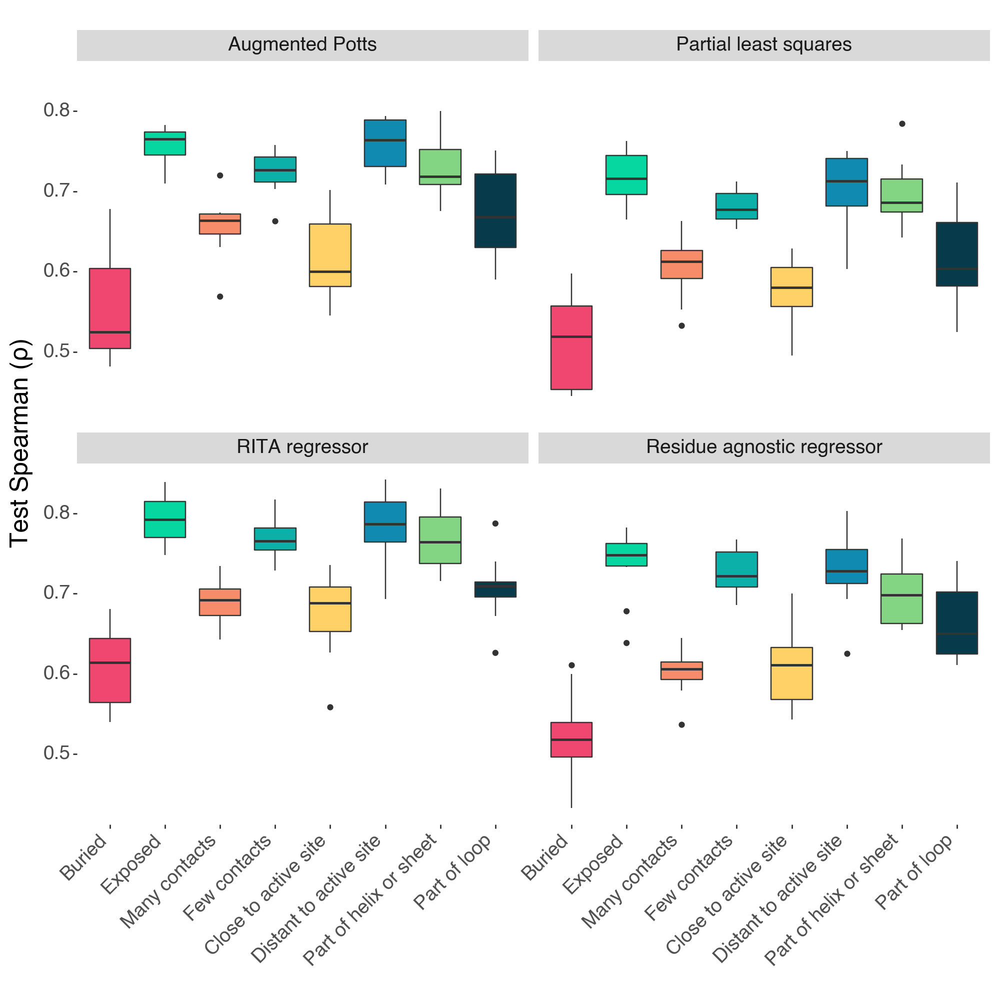

In [11]:
p = (
    p9.ggplot(
        combis_results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

# 2.5 Single mutation variant effect predictability depends on the same structural characteristics

## Box plot of Spearman performance on the AMY_BACSU singles dataset by structural class for all four models

In [12]:
plot_name = "AMY_BACSU_singles_predictability"
amy_bacsu_singles_results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / "results/AMY_BACSU/singles/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/AMY_BACSU_singles_predictability.pdf


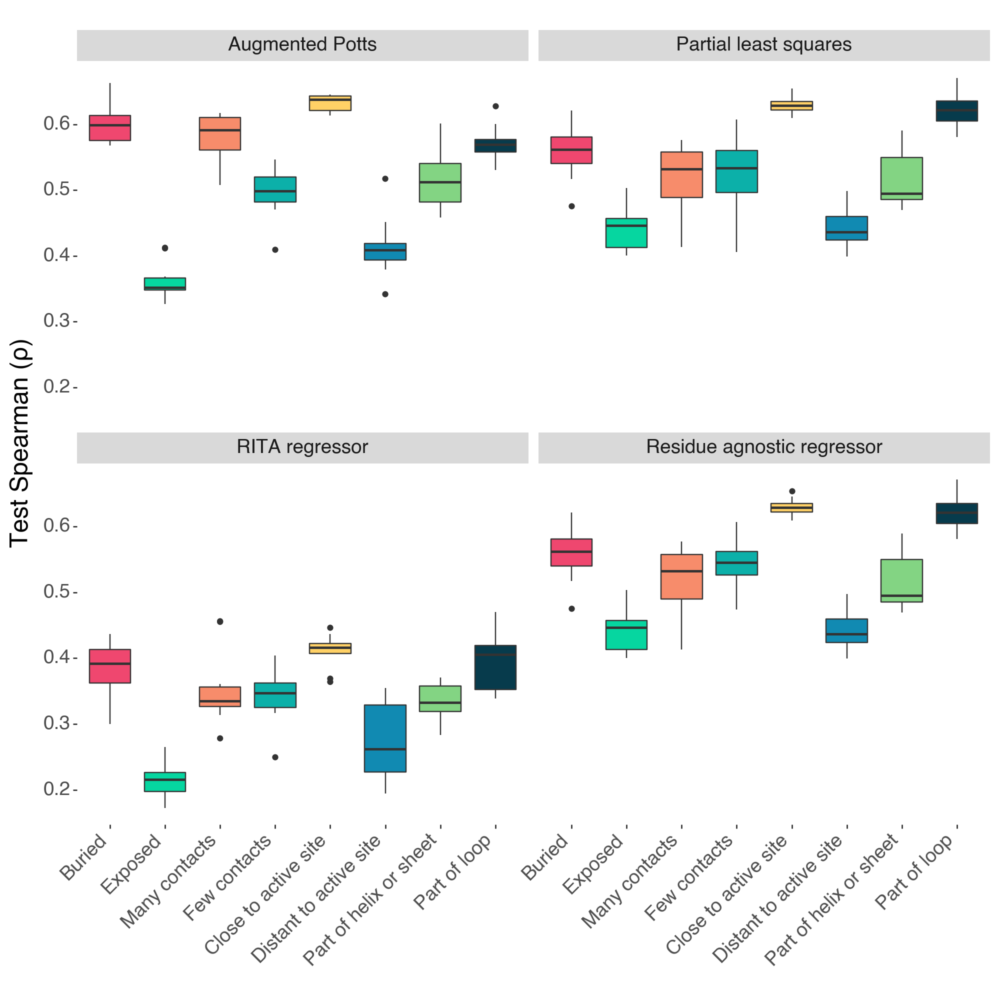

In [13]:
p = (
    p9.ggplot(
        amy_bacsu_singles_results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        plot_background=p9.element_rect(fill="white"),
        panel_background=p9.element_rect(fill="white"),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

# A Supplementary materials

## Box plot of Spearman performance on the SSM datasets by structural class for all four models

## A2RQE2_9CELL

In [14]:
dataset_name = "A2RQE2_9CELL"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/A2RQE2_9CELL_singles_predictability.pdf


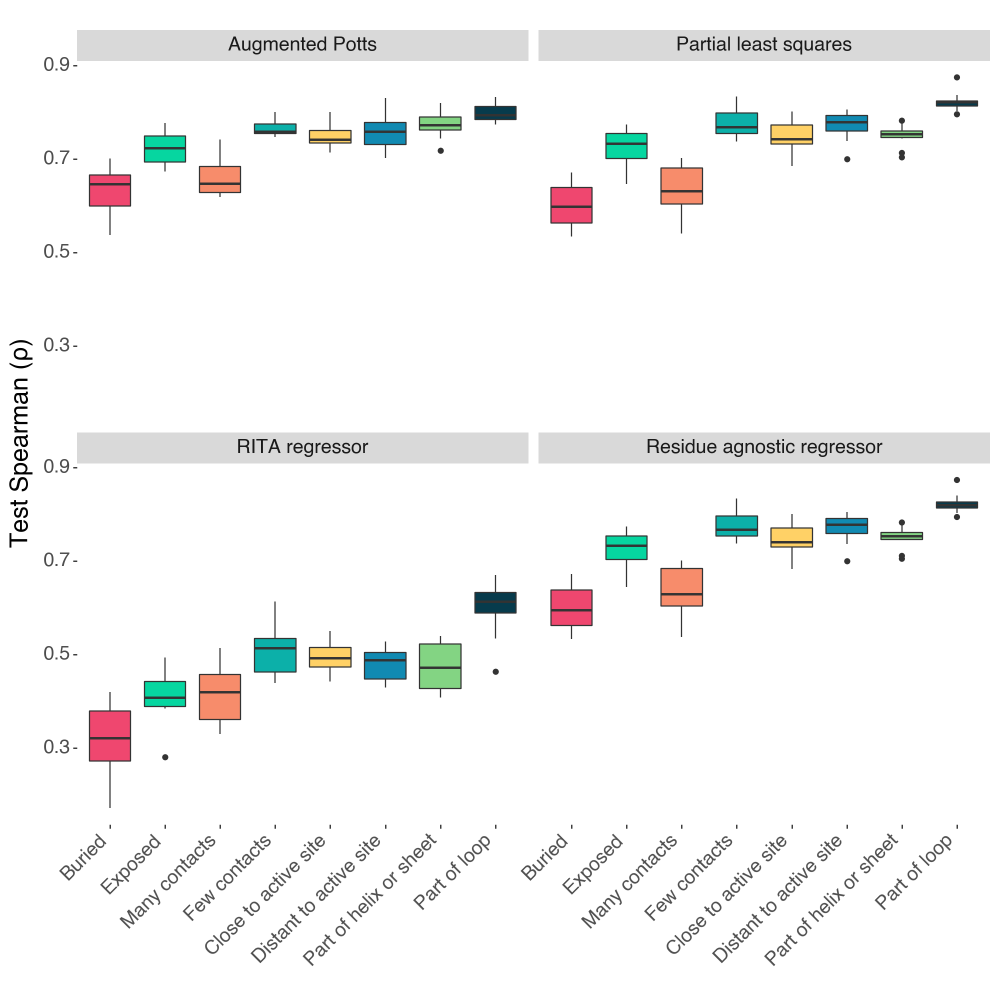

In [15]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

## AMIE_PSEAE_Wrenbeck_2017

In [16]:
dataset_name = "AMIE_PSEAE_Wrenbeck_2017"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/AMIE_PSEAE_Wrenbeck_2017_singles_predictability.pdf


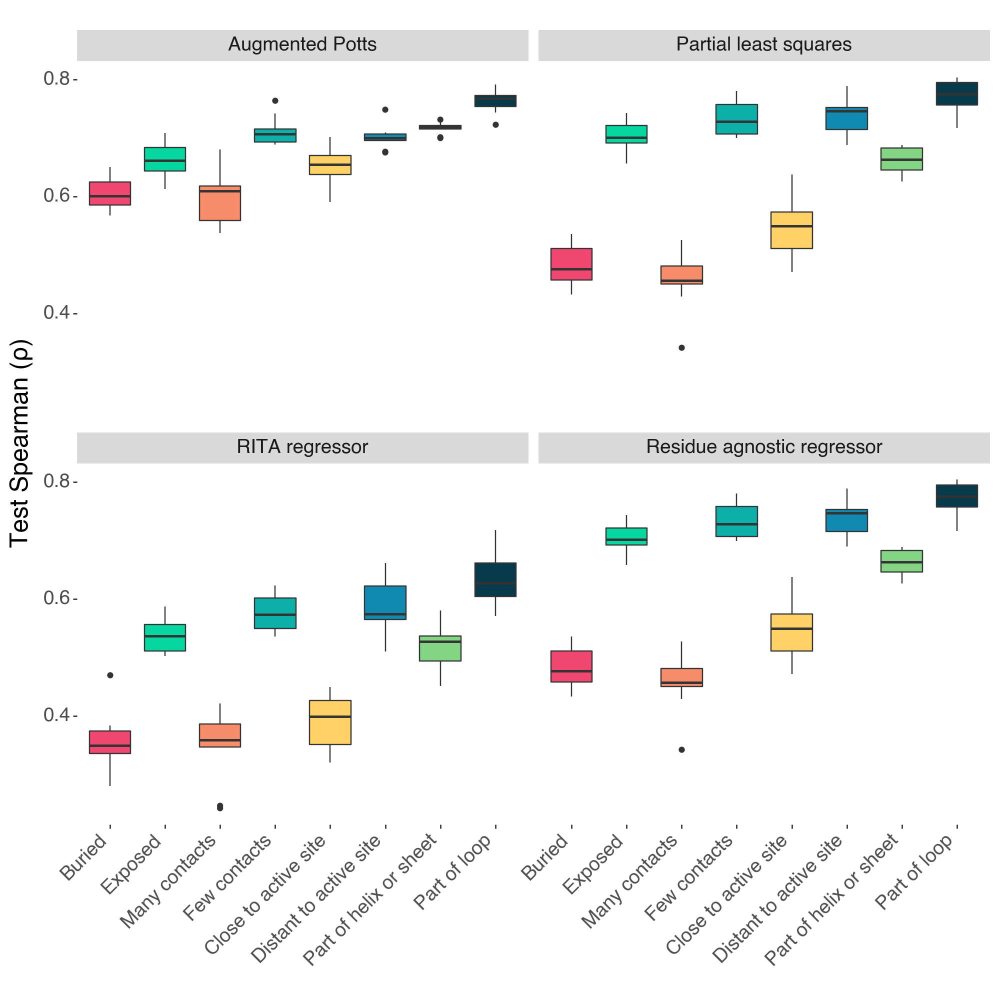

In [17]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

## BLAT_ECOLX_Deng_2012

In [18]:
dataset_name = "BLAT_ECOLX_Deng_2012"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/BLAT_ECOLX_Deng_2012_singles_predictability.pdf


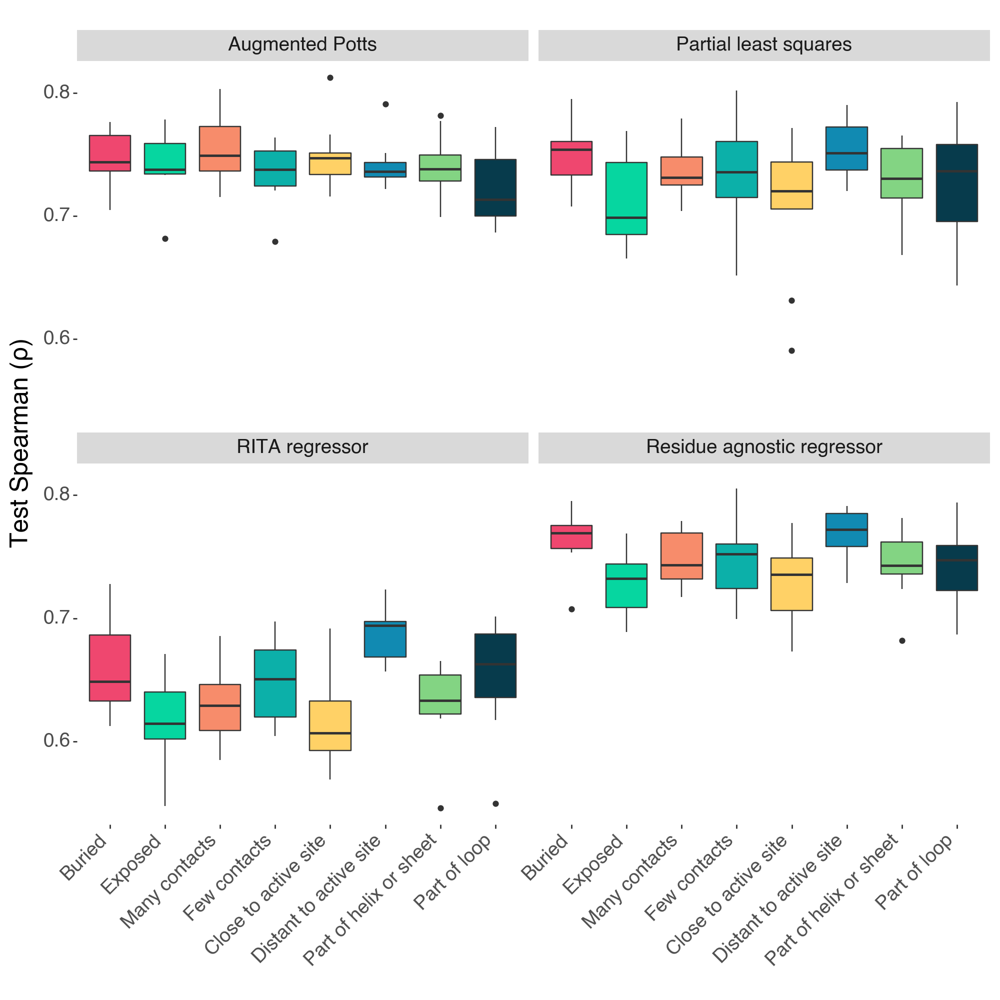

In [19]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

## BLAT_ECOLX_Firnberg_2014

In [20]:
dataset_name = "BLAT_ECOLX_Firnberg_2014"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/BLAT_ECOLX_Firnberg_2014_singles_predictability.pdf


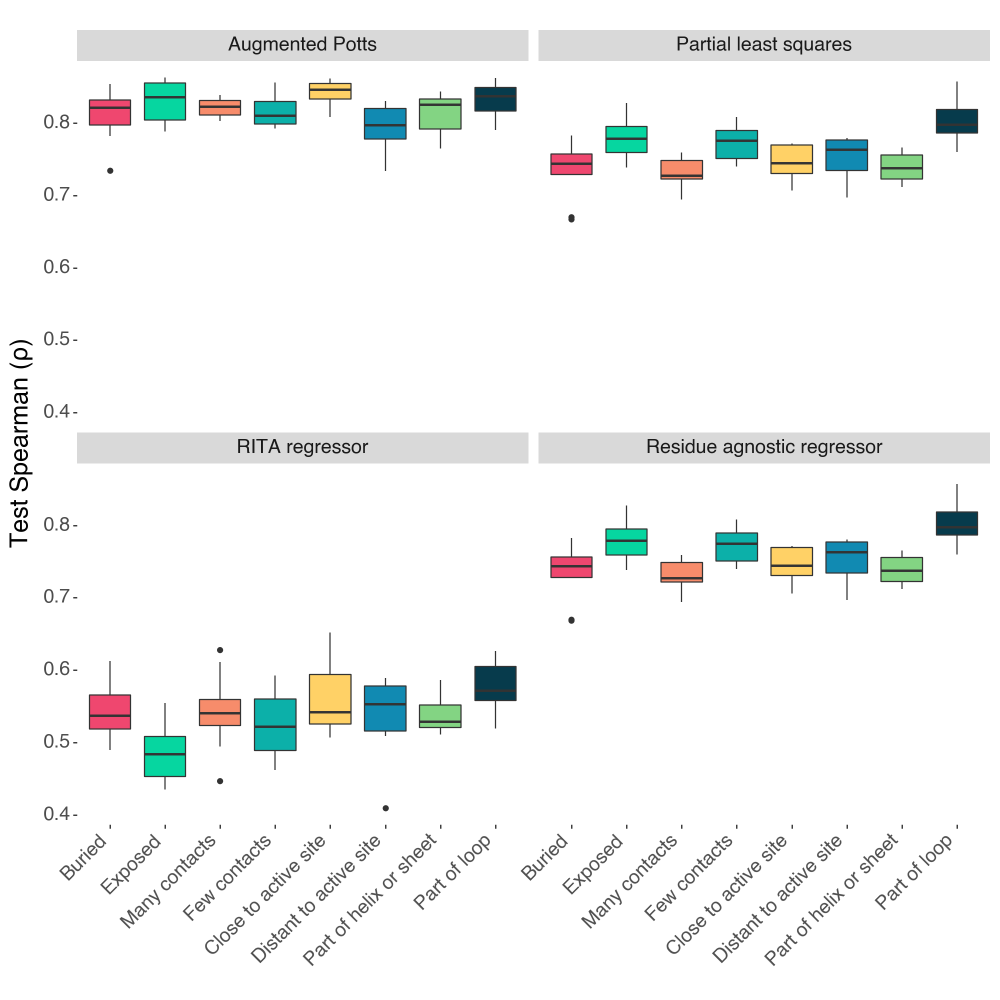

In [21]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

## BLAT_ECOLX_Stiffler_2015

In [22]:
dataset_name = "BLAT_ECOLX_Stiffler_2015"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/BLAT_ECOLX_Stiffler_2015_singles_predictability.pdf


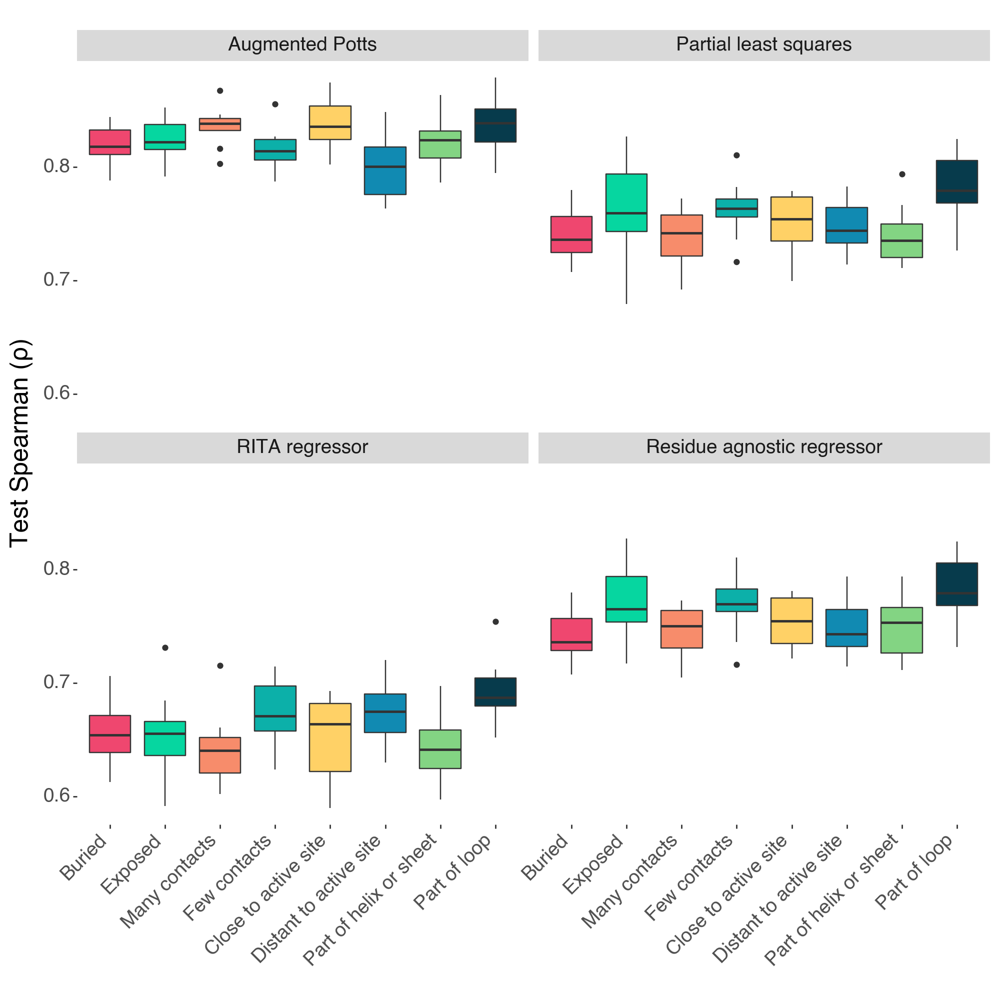

In [23]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

## CASP3_HUMAN_Roychowdhury_2020

In [24]:
dataset_name = "CASP3_HUMAN_Roychowdhury_2020"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/CASP3_HUMAN_Roychowdhury_2020_singles_predictability.pdf


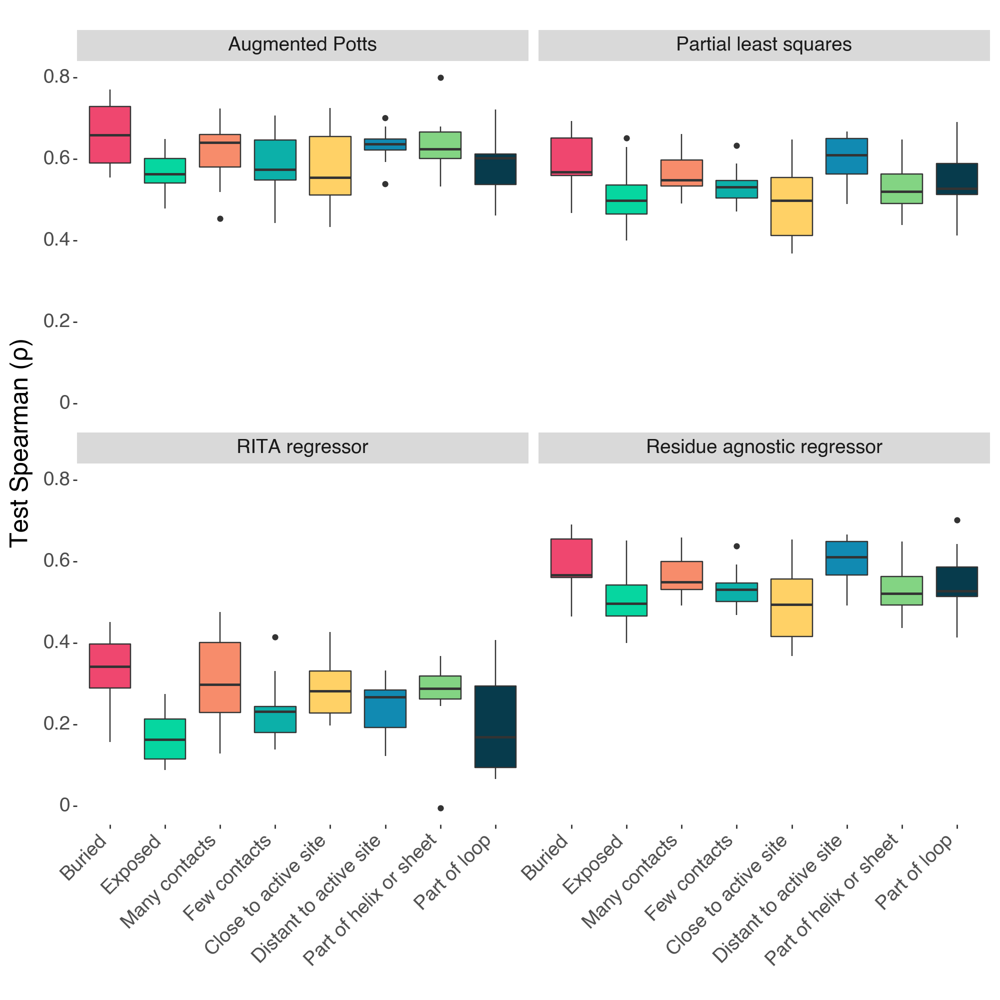

In [25]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

## MK01_HUMAN_Brenan_2016

In [26]:
dataset_name = "MK01_HUMAN_Brenan_2016"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/MK01_HUMAN_Brenan_2016_singles_predictability.pdf


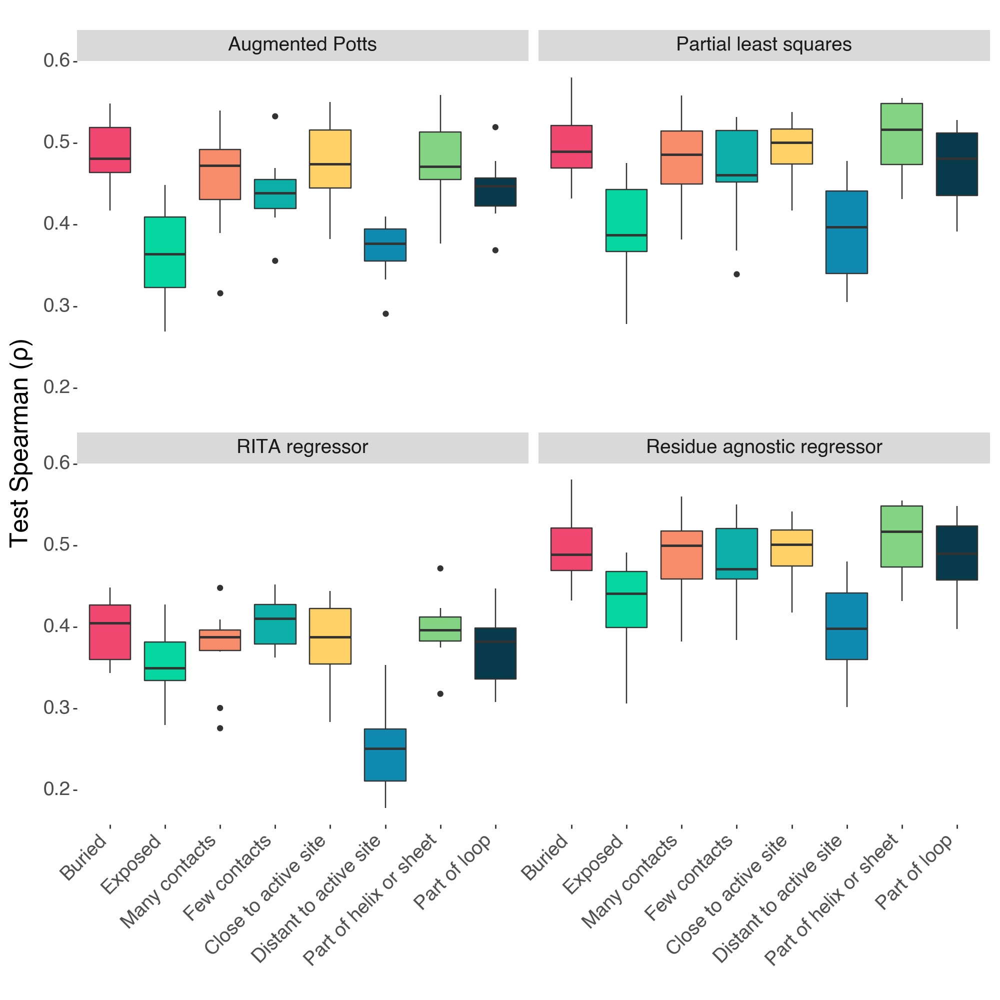

In [27]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

## PTEN_HUMAN_Mighell_2018

In [28]:
dataset_name = "PTEN_HUMAN_Mighell_2018"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/PTEN_HUMAN_Mighell_2018_singles_predictability.pdf


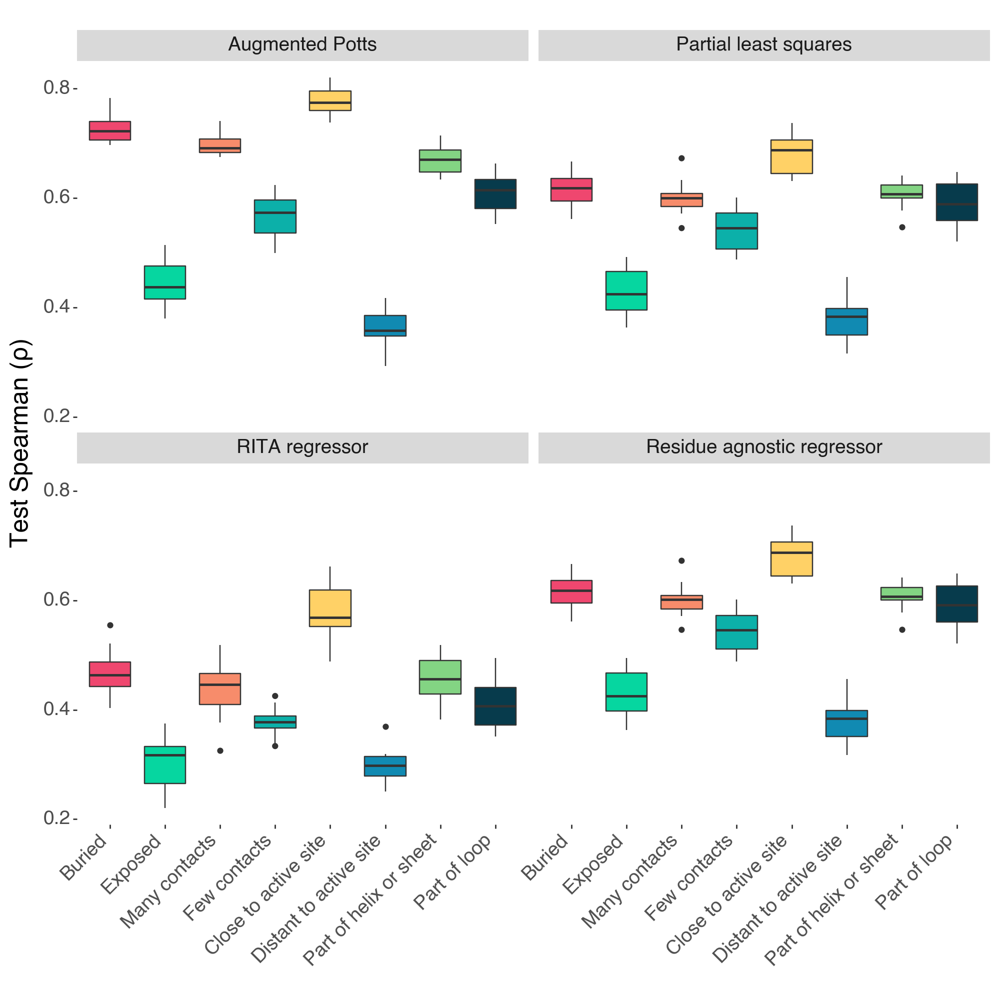

In [29]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

## SRC_HUMAN_Ahler_2019

In [30]:
dataset_name = "SRC_HUMAN_Ahler_2019"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/SRC_HUMAN_Ahler_2019_singles_predictability.pdf


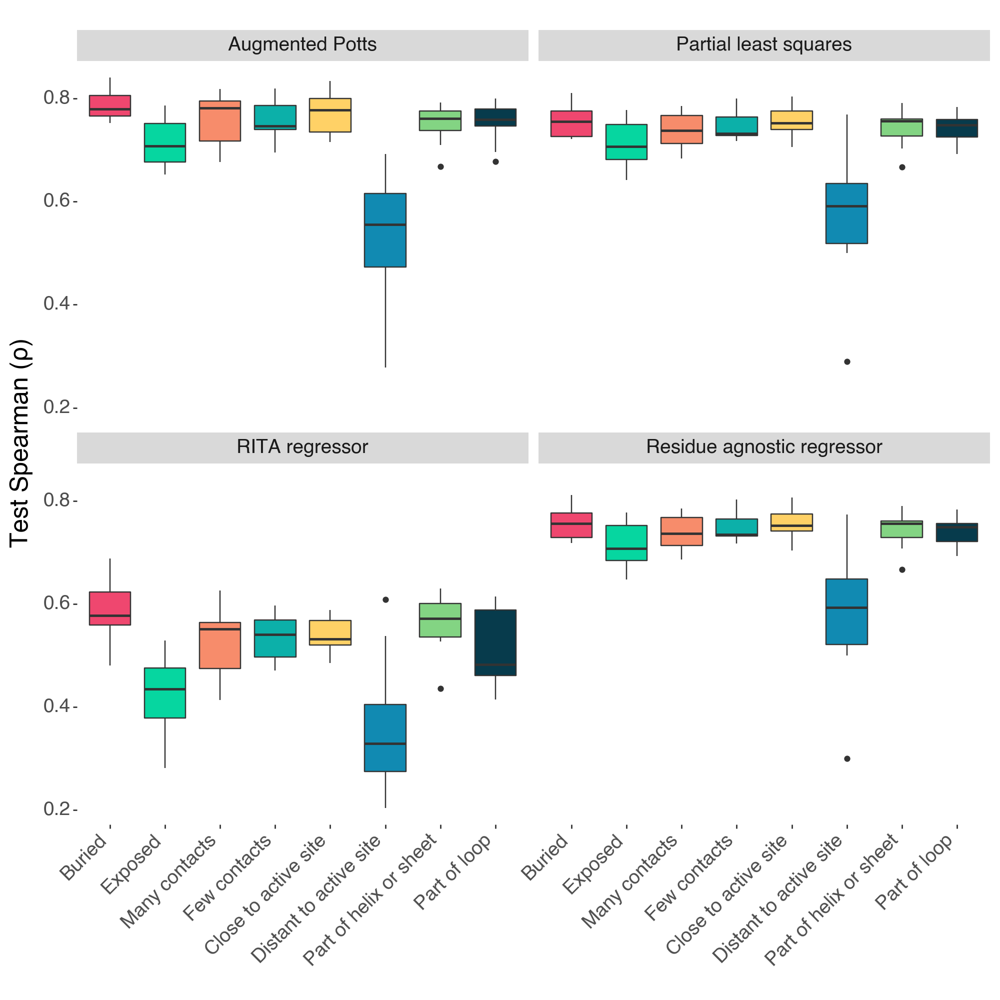

In [31]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

## UBC9_HUMAN_Weile_2017

In [32]:
dataset_name = "UBC9_HUMAN_Weile_2017"
plot_name = f"{dataset_name}_singles_predictability"
results = format_predictability_results(
    pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv", index_col=None)
)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 10 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/UBC9_HUMAN_Weile_2017_singles_predictability.pdf


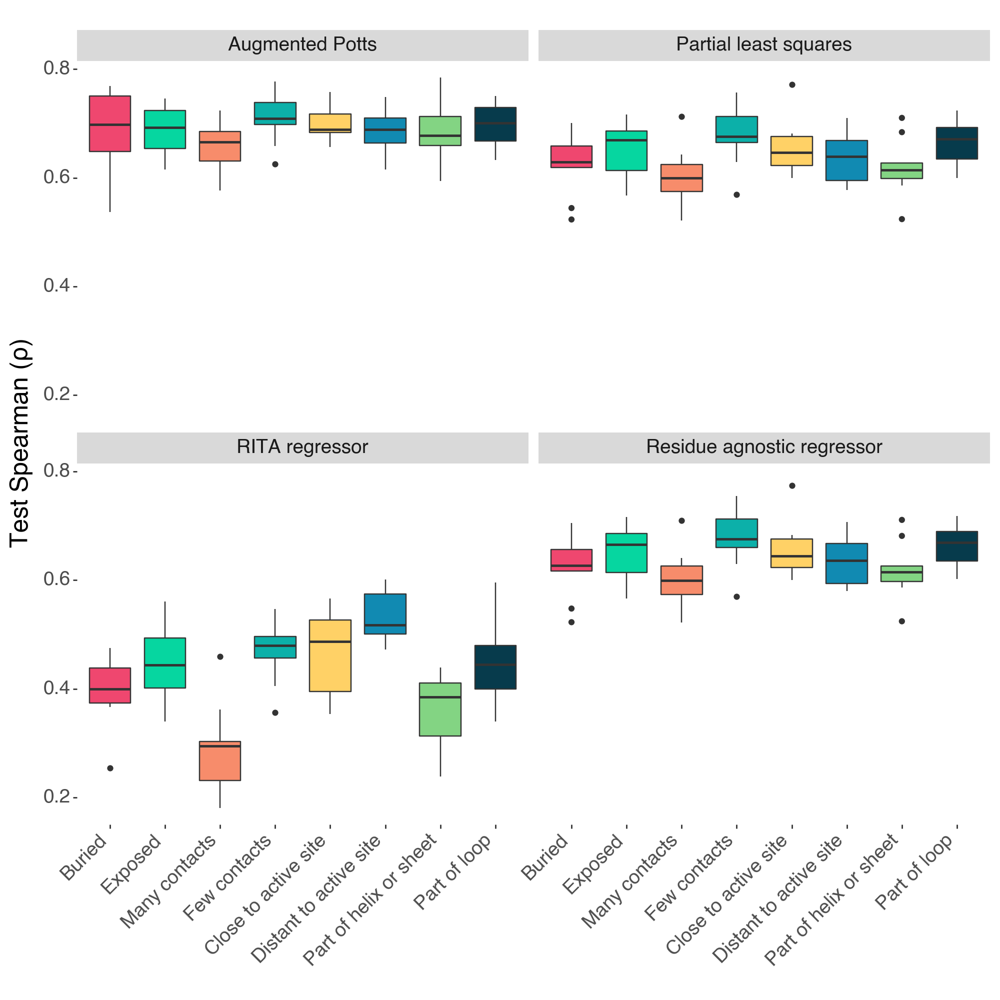

In [33]:
p = (
    p9.ggplot(
        results,
        p9.aes(
            "Structural class",
            "Test spearman",
            fill="Structural class",
        )
    )
    + p9.geom_boxplot(show_legend=False)
    + p9.facet_wrap("model", nrow=2, ncol=2)
    + p9.theme(
        figure_size=(10, 10), 
        axis_text_x=p9.element_text(rotation=45, ha="right", size=14),
        axis_text_y=p9.element_text(size=14),
        strip_text=p9.element_text(size=14),
        panel_background=p9.element_blank(),
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
    )
    + p9.scale_fill_manual(values=color_mapping)
    + p9.labs(x="")
)
p.draw()
p.save(save_dir / f"{plot_name}.pdf")
print(p)

# Parallel coordinates plots of Spearman Delta Mu for all datasets

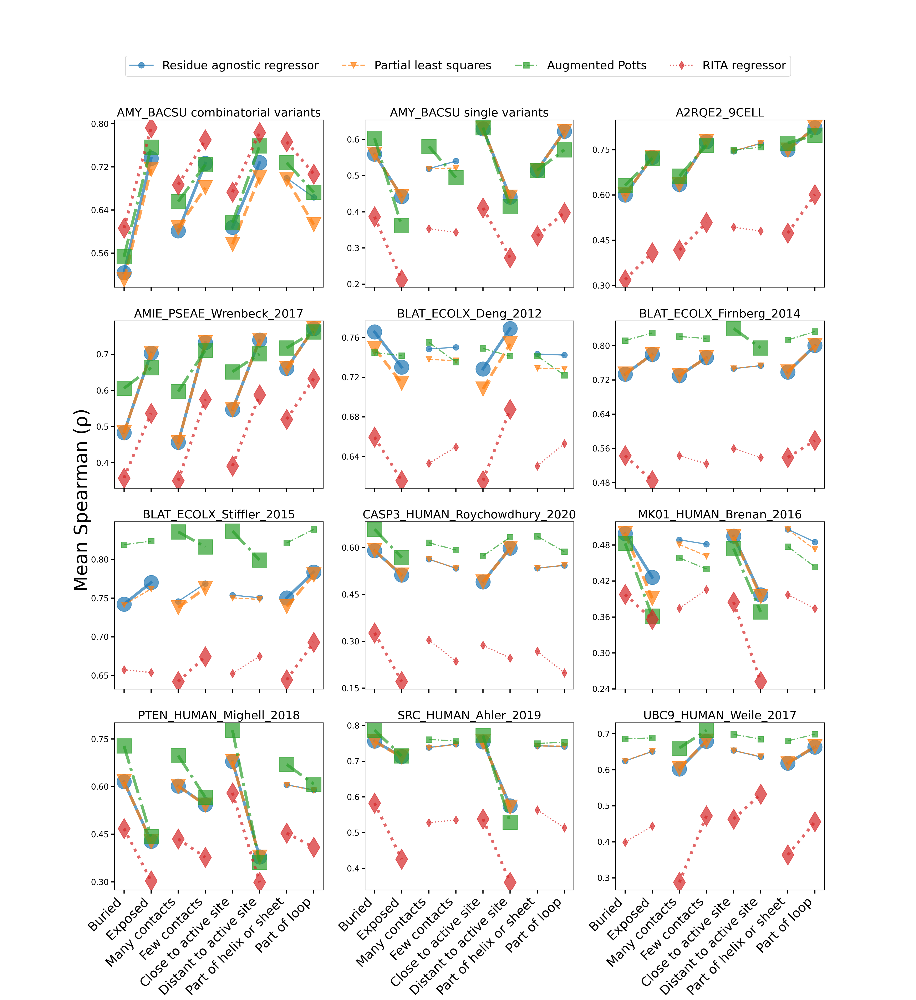

In [34]:
sns.reset_orig()

datasets = [
    "AMY_BACSU/combinatorials",
    "AMY_BACSU/singles",
    "A2RQE2_9CELL",
    "AMIE_PSEAE_Wrenbeck_2017",
    "BLAT_ECOLX_Deng_2012",
    "BLAT_ECOLX_Firnberg_2014",
    "BLAT_ECOLX_Stiffler_2015",
    "CASP3_HUMAN_Roychowdhury_2020",
    "MK01_HUMAN_Brenan_2016",
    "PTEN_HUMAN_Mighell_2018",
    "SRC_HUMAN_Ahler_2019",
    "UBC9_HUMAN_Weile_2017",
]
title_map = {
    "AMY_BACSU/combinatorials": "AMY_BACSU combinatorial variants",
    "AMY_BACSU/singles": "AMY_BACSU single variants",
}

model_linestyle_kwargs = {
    "Residue agnostic regressor": dict(linestyle="-", marker="o", c="C0"),
    "Partial least squares": dict(linestyle="--", marker="v", c="C1"),
    "Augmented Potts": dict(linestyle="-.", marker="s", c="C2"),
    "RITA regressor": dict(linestyle=":", marker="d", c="C3")
}

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(22, 24))
grid_indices = product(range(4), range(3))
for dataset_name, (row_index, col_index) in zip(datasets, grid_indices):
    if dataset_name is None:
        continue
    results = pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv")
    for model in results.model.unique():
        ttest_p_vals = []
        coordinates = {}
        for feature in BINARY_RESIDUE_FEATURES:
            spearman_groups = []
            for is_member in [1, 0]:
                spearmans = results[
                    (results.model == model) &
                    (results.structural_characteristic == feature) &
                    (results.is_member == is_member)
                ]["spearman"]
                mean_spearman = spearmans.mean()
                spearman_groups.append(spearmans.values)
                structural_class = df_descriptors_to_features[(feature, is_member)]
                coordinates[structural_class] = mean_spearman
            _, p_value = ttest_ind(spearman_groups[0], spearman_groups[1])
            ttest_p_vals.append(p_value)
        title = title_map.get(dataset_name) or dataset_name
        axes[row_index, col_index].set_title(title, fontsize=20)
        coord_items = list(coordinates.items())
        for i, p_val in zip(range(0, len(coord_items) - 1, 2), ttest_p_vals):
            x_vals = [i, i + 1]
            y_vals = [coord_items[i][1], coord_items[i + 1][1]]
            axes[row_index, col_index].plot(
                x_vals, y_vals,
                markersize=10 if p_val > 0.05 else 25,
                alpha=0.7,
                label=model if i == 0 else "",
                linewidth=2 if p_val > 0.05 else 5,
                **model_linestyle_kwargs[model]
            )
        if row_index == 3:
            axes[row_index, col_index].set_xticks(range(len(coordinates)), labels=coordinates.keys(), rotation=45, fontsize=22, ha="right")
        else:
            axes[row_index, col_index].set_xticks(range(len(coordinates)), labels=[""] * len(coordinates))
        axes[row_index, col_index].tick_params(axis="y", which="major", labelsize=14, length=6, width=2, direction="out")
        axes[row_index, col_index].tick_params(axis="x", which="major", length=6, width=2, direction="out")
        axes[row_index, col_index].yaxis.set_major_locator(MaxNLocator(nbins=5))
        
fig.text(0.08, 0.5, "Mean Spearman (ρ)", va="center", rotation="vertical", fontsize=32)
handles, labels = axes[1, 1].get_legend_handles_labels()
new_handles = []
for handle in handles:
    if isinstance(handle, Line2D):
        new_handle = copy.copy(handle)
        new_handle.set_linewidth(2)
        new_handle.set_markersize(10)
        new_handles.append(new_handle)
    else:
        new_handles.append(handle)
fig.legend(new_handles, labels, loc="upper center", fontsize=20, ncols=4, bbox_to_anchor=(0.5, 0.95))
plt.savefig(save_dir / "parallel_coordinates.pdf")
plt.show()

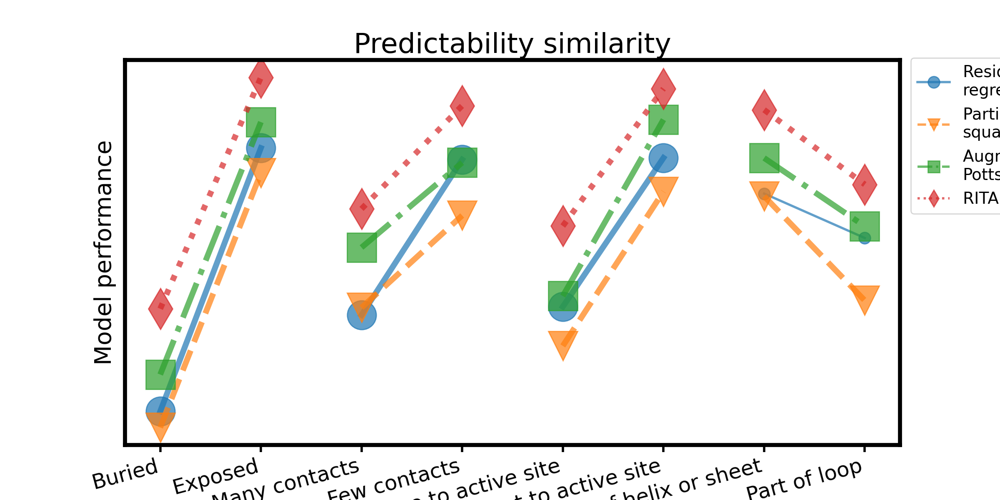

In [35]:
sns.reset_orig()

model_linestyle_kwargs = {
    "Residue agnostic regressor": dict(linestyle="-", marker="o", c="C0"),
    "Partial least squares": dict(linestyle="--", marker="v", c="C1"),
    "Augmented Potts": dict(linestyle="-.", marker="s", c="C2"),
    "RITA regressor": dict(linestyle=":", marker="d", c="C3")
}

dataset_name = "AMY_BACSU/combinatorials"
fig, ax = plt.subplots(figsize=(12, 6))
results = pd.read_csv(PROJECT_ROOT / f"results/{dataset_name}/results.csv")
for model in results.model.unique():
    ttest_p_vals = []
    coordinates = {}
    for feature in BINARY_RESIDUE_FEATURES:
        spearman_groups = []
        for is_member in [1, 0]:
            spearmans = results[
                (results.model == model) &
                (results.structural_characteristic == feature) &
                (results.is_member == is_member)
            ]["spearman"]
            mean_spearman = spearmans.mean()
            spearman_groups.append(spearmans.values)
            structural_class = df_descriptors_to_features[(feature, is_member)]
            coordinates[structural_class] = mean_spearman
        _, p_value = ttest_ind(spearman_groups[0], spearman_groups[1])
        ttest_p_vals.append(p_value)
    title = "Predictability similarity"
    ax.set_title(title, fontsize=24)
    coord_items = list(coordinates.items())
    for i, p_val in zip(range(0, len(coord_items) - 1, 2), ttest_p_vals):
        x_vals = [i, i + 1]
        y_vals = [coord_items[i][1], coord_items[i + 1][1]]
        ax.plot(
            x_vals, y_vals,
            markersize=10 if p_val > 0.05 else 25,
            alpha=0.7,
            label=model if i == 0 else "",
            linewidth=2 if p_val > 0.05 else 5,
            **model_linestyle_kwargs[model]
        )
    ax.set_xticks(range(len(coordinates)), labels=coordinates.keys(), rotation=15, fontsize=18, ha="right")
    ax.set_yticklabels([])
    ax.tick_params(axis="y", which="major", length=0)
    ax.tick_params(axis="x", which="major", length=6, width=2, direction="out")
    ax.yaxis.set_major_locator(MaxNLocator(nbins=5))
        
ax.set_ylabel("Model performance", fontsize=20)
handles, labels = ax.get_legend_handles_labels()
new_handles = []
for handle in handles:
    if isinstance(handle, Line2D):
        new_handle = copy.copy(handle)
        new_handle.set_linewidth(2)
        new_handle.set_markersize(10)
        new_handles.append(new_handle)
    else:
        new_handles.append(handle)
        
new_labels = [
    "Residue agnostic \nregressor",
    "Partial least \nsquares",
    "Augmented \nPotts",
    "RITA regressor"
]
fig.legend(new_handles, new_labels, fontsize=14, ncols=1, bbox_to_anchor=(1.12, 0.90))
#plt.tight_layout()
for axis in ['top', 'bottom', 'left', 'right']:
    ax.spines[axis].set_linewidth(3.5)
plt.savefig(save_dir / "predictability_similarity.pdf", bbox_inches="tight")
plt.show()


## Marginal probabilities of class membership of all enzymes

## AMY_BACSU

In [36]:
dataset_name = "AMY_BACSU"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "singles/data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

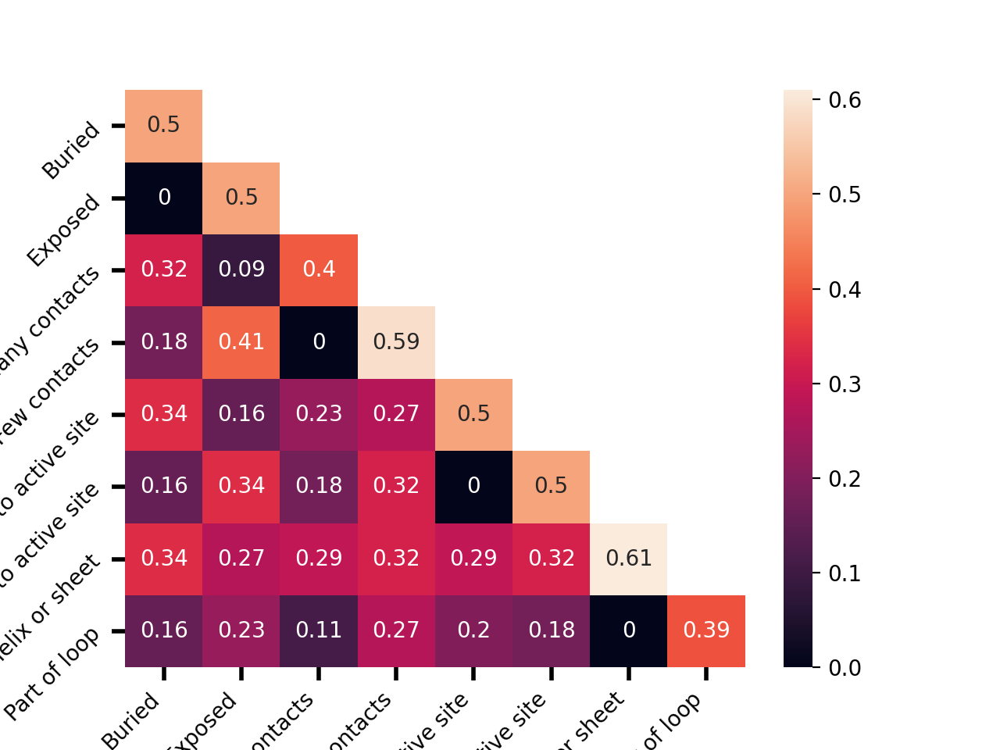

In [37]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## A2RQE2_9CELL

In [38]:
dataset_name = "A2RQE2_9CELL"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

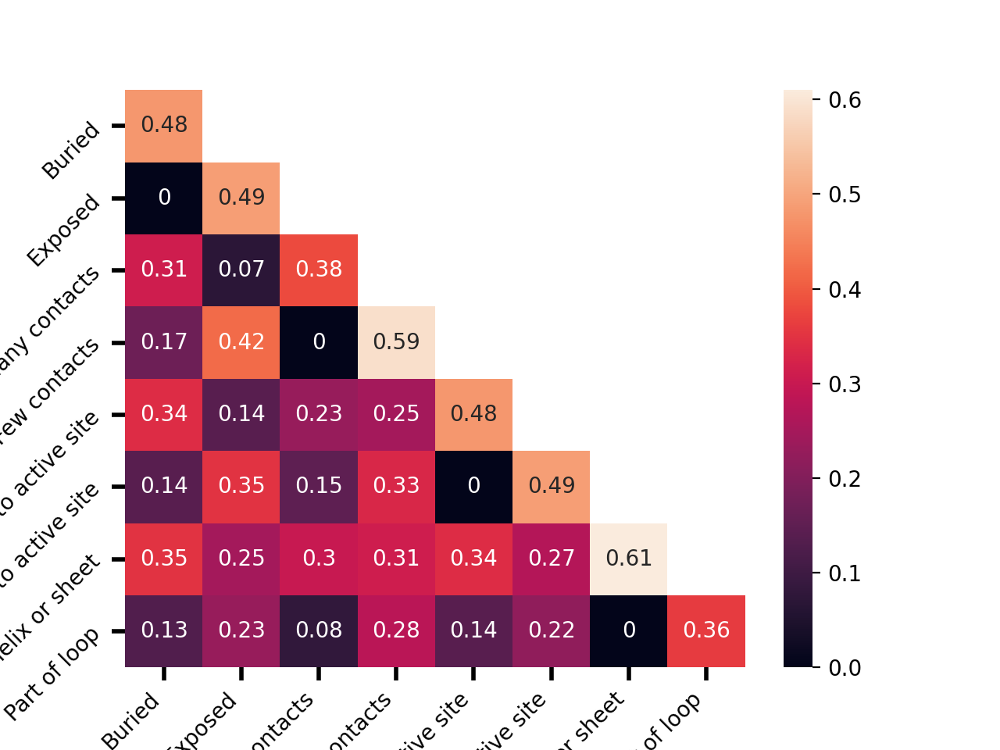

In [39]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## AMIE_PSEAE_Wrenbeck_2017

In [40]:
dataset_name = "AMIE_PSEAE_Wrenbeck_2017"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

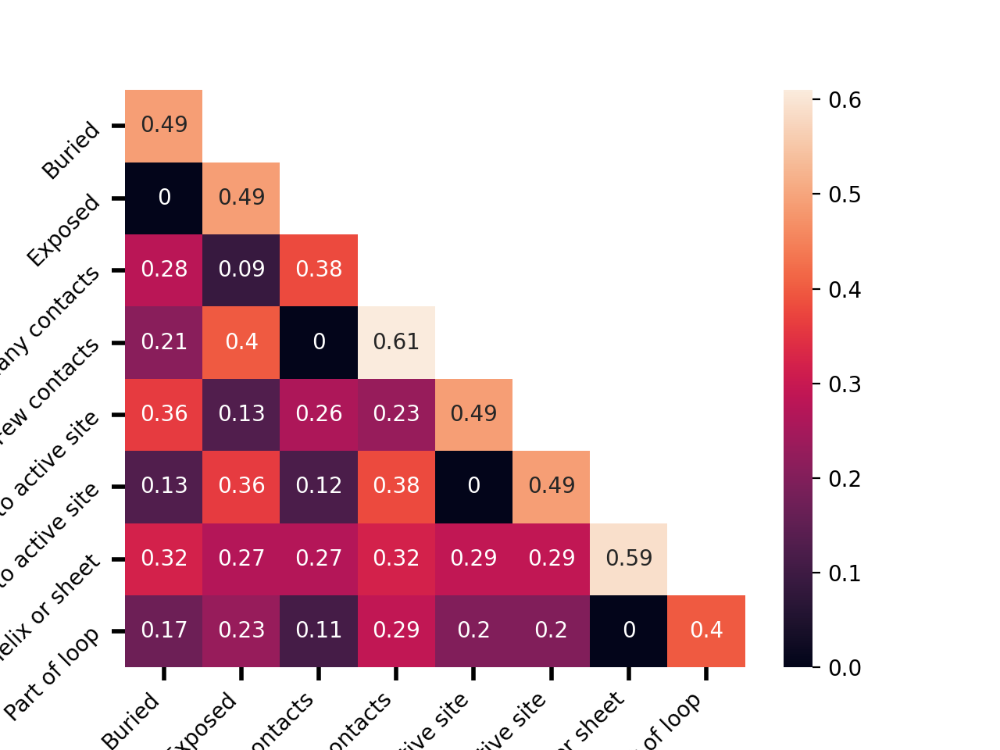

In [41]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## BLAT_ECOLX_Deng_2012

In [42]:
dataset_name = "BLAT_ECOLX_Deng_2012"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

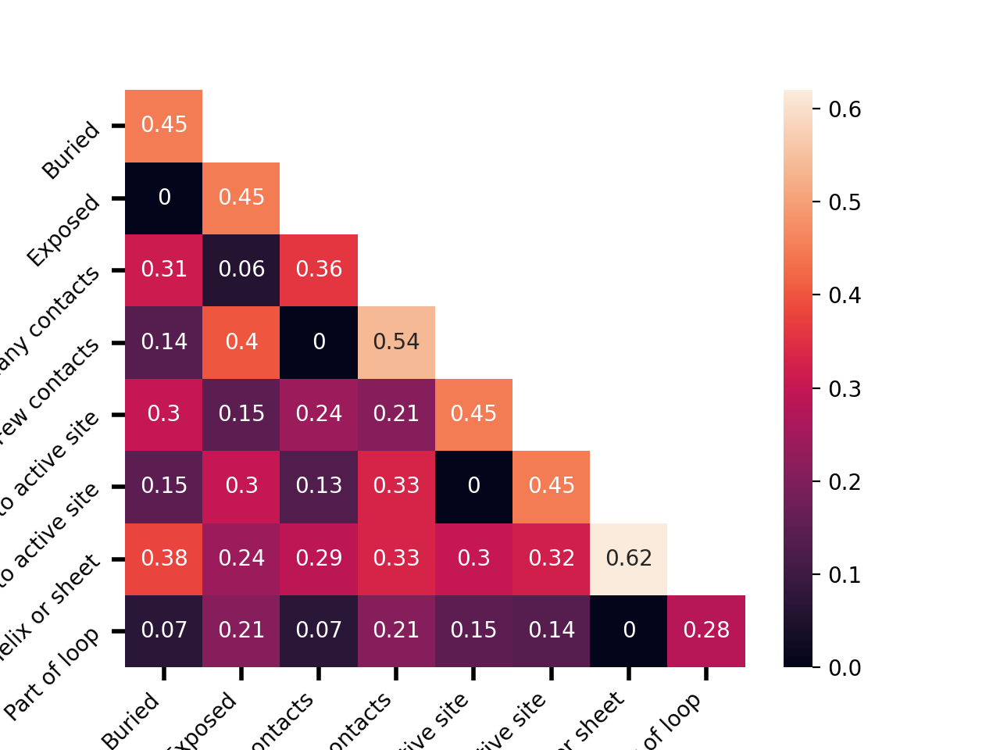

In [43]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## BLAT_ECOLX_Firnberg_2014

In [44]:
dataset_name = "BLAT_ECOLX_Firnberg_2014"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

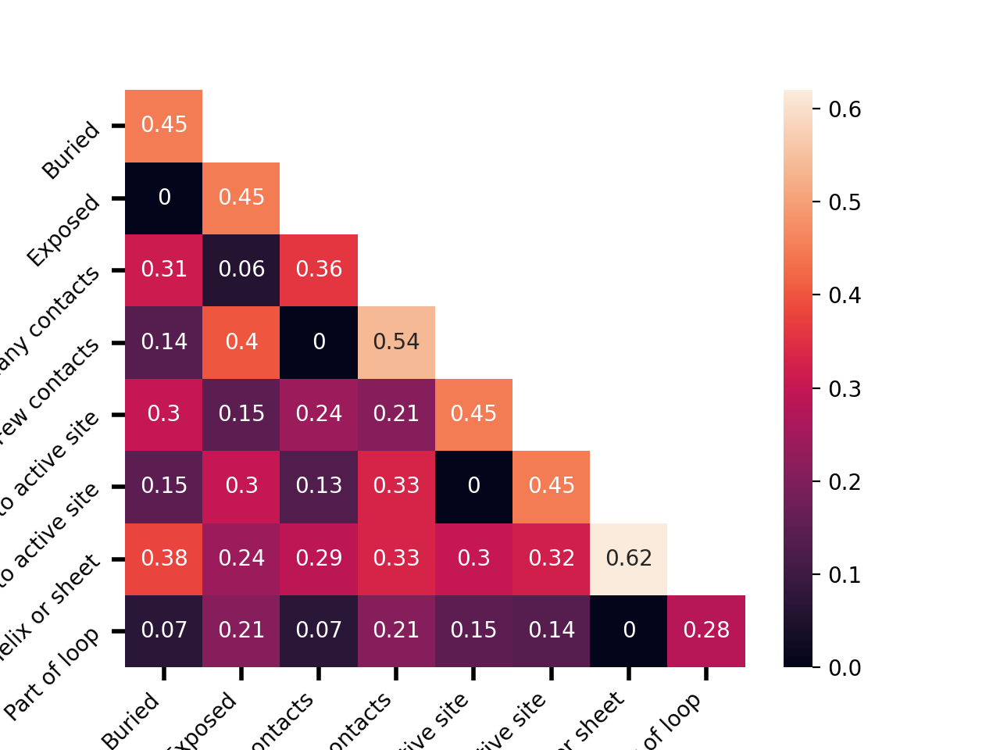

In [45]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## BLAT_ECOLX_Stiffler_2015

In [46]:
dataset_name = "BLAT_ECOLX_Stiffler_2015"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

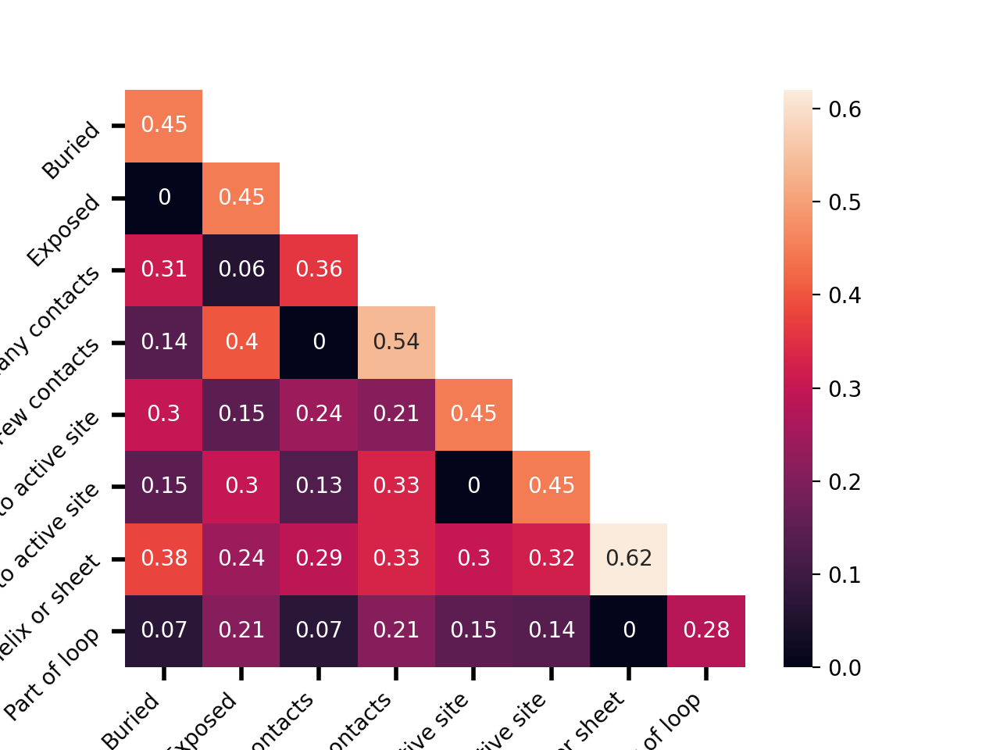

In [47]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## CASP3_HUMAN_Roychowdhury_2020

In [48]:
dataset_name = "CASP3_HUMAN_Roychowdhury_2020"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

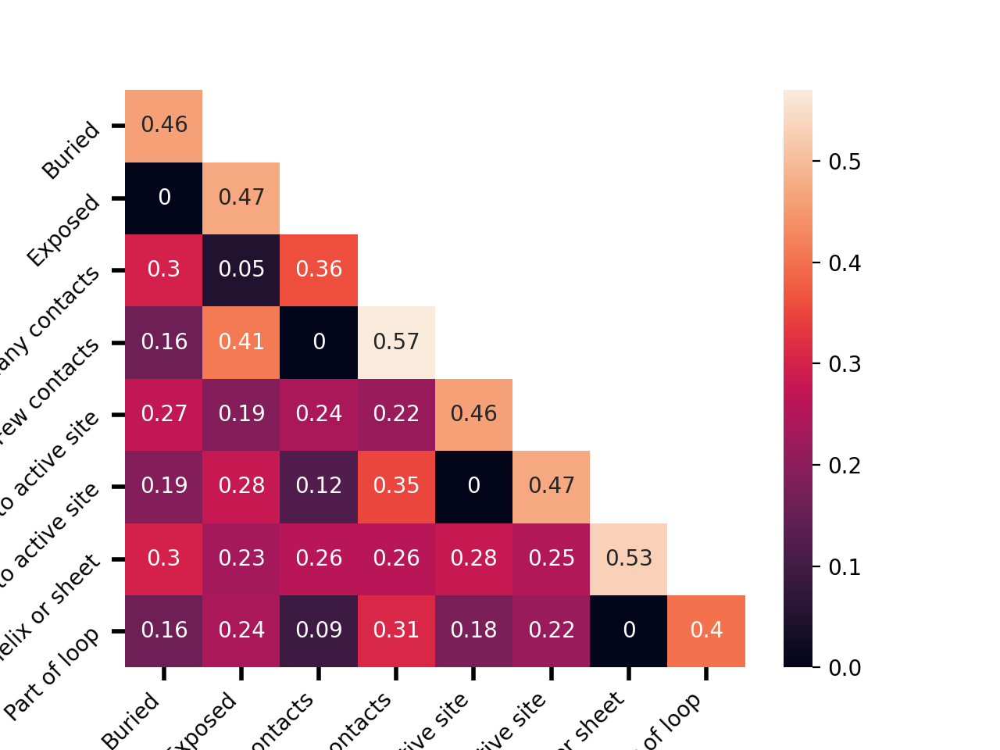

In [49]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## MK01_HUMAN_Brenan_2016

In [50]:
dataset_name = "MK01_HUMAN_Brenan_2016"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

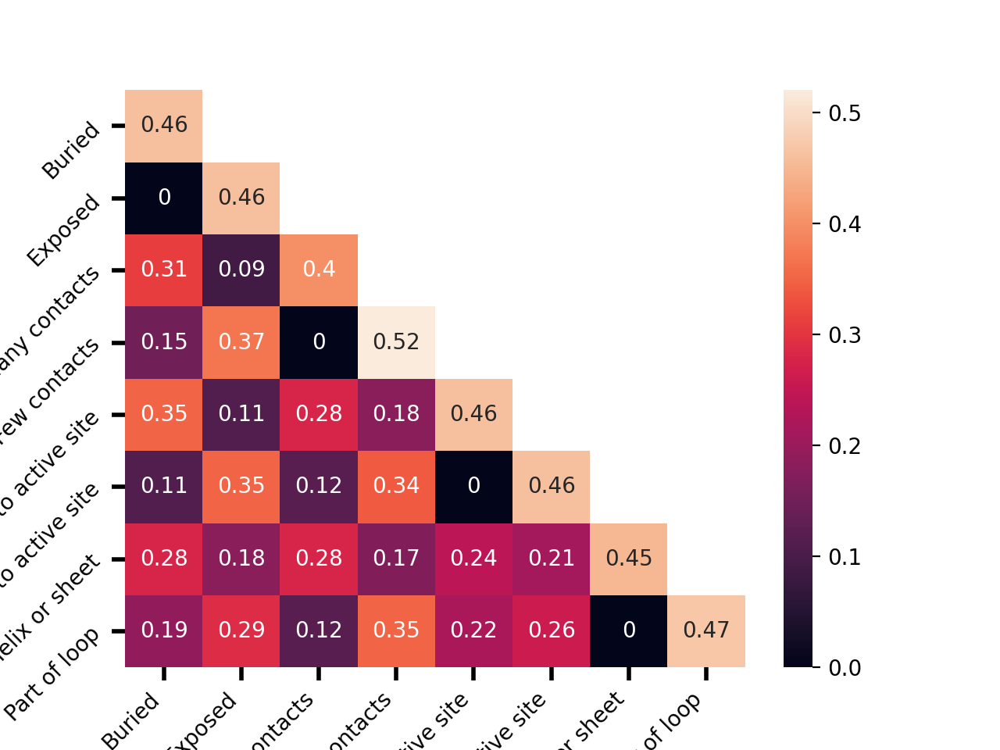

In [51]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## PTEN_HUMAN_Mighell_2018

In [52]:
dataset_name = "PTEN_HUMAN_Mighell_2018"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

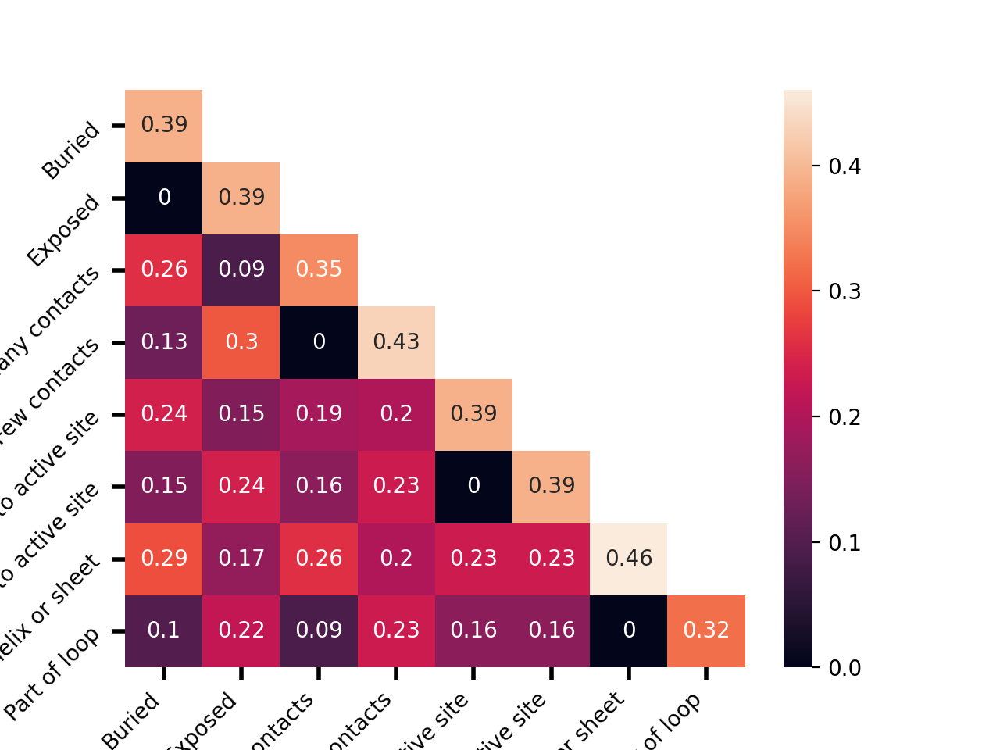

In [53]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## SRC_HUMAN_Ahler_2019

In [54]:
dataset_name = "SRC_HUMAN_Ahler_2019"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

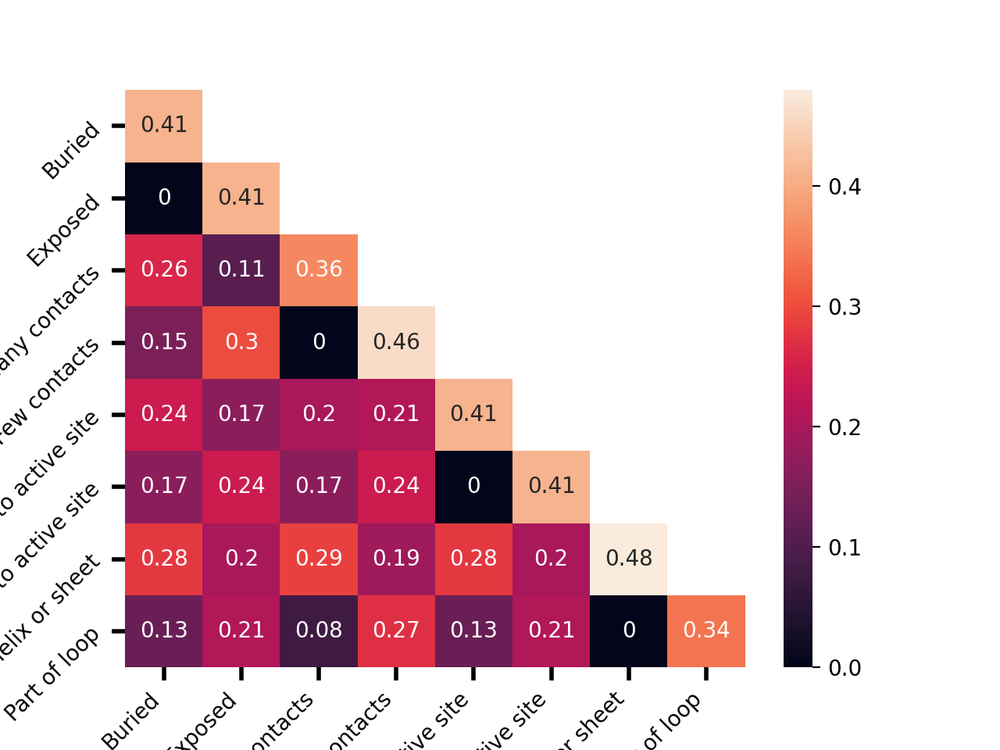

In [55]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## UBC9_HUMAN_Weile_2017

In [56]:
dataset_name = "UBC9_HUMAN_Weile_2017"
plot_name = f"{dataset_name}_marginals"
sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)

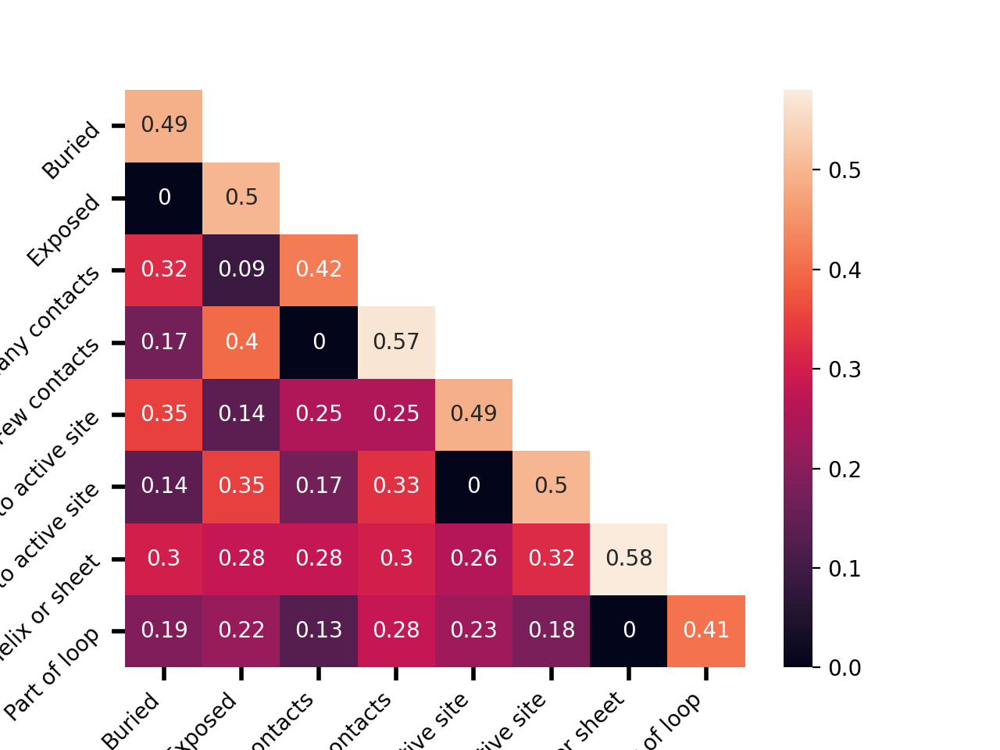

In [57]:
fig, ax = plot_marginal_probabilities(marginals, labels=features_to_df_descriptors.keys())
fig.savefig(save_dir / f"{plot_name}.pdf")

## Marginal probabilities of all enzymes

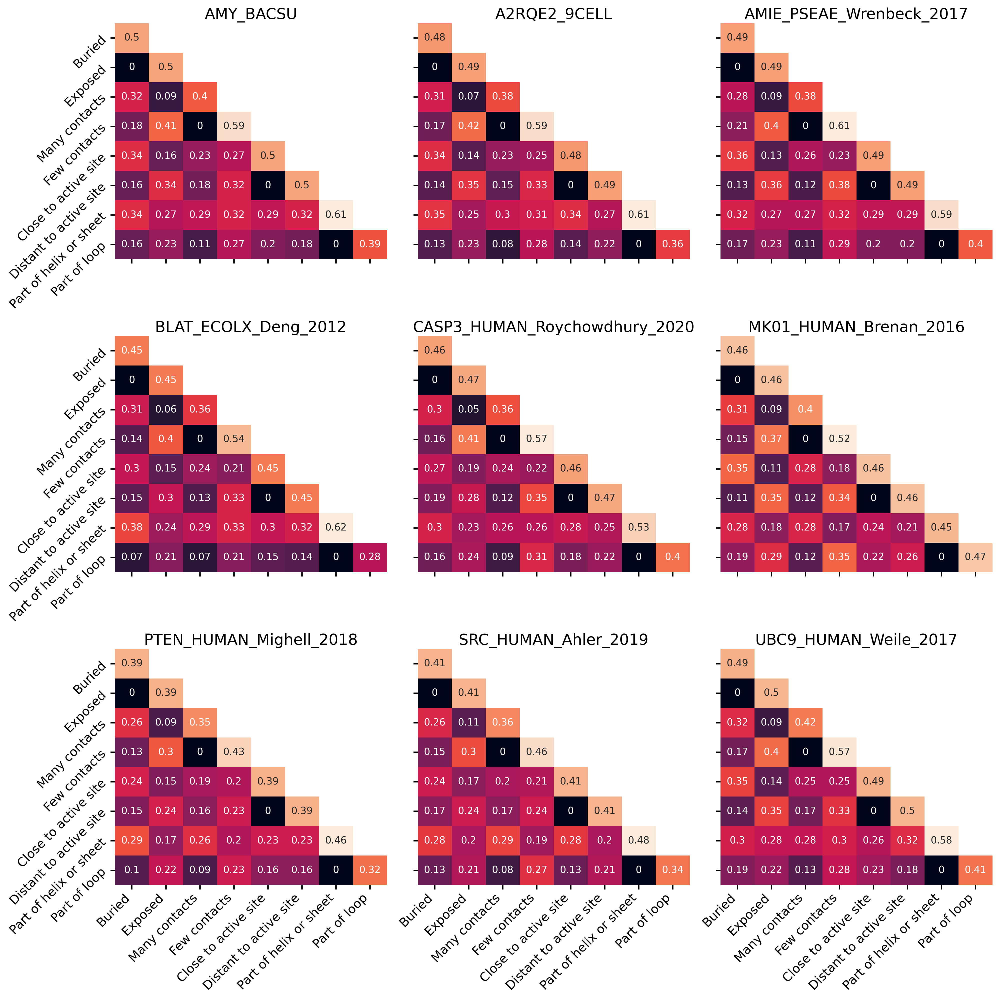

In [58]:
datasets = [
    "AMY_BACSU",
    "A2RQE2_9CELL",
    "AMIE_PSEAE_Wrenbeck_2017",
    "BLAT_ECOLX_Deng_2012",
    "CASP3_HUMAN_Roychowdhury_2020",
    "MK01_HUMAN_Brenan_2016",
    "PTEN_HUMAN_Mighell_2018",
    "SRC_HUMAN_Ahler_2019",
    "UBC9_HUMAN_Weile_2017",
]
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 20))
grid_indices = product(range(3), range(3))

for dataset_name, (row_index, col_index) in zip(datasets, grid_indices):
    if dataset_name == "AMY_BACSU":
        sequence_length = 425
    else:
        sequence_length = len(pd.read_csv(DATA_ROOT / dataset_name / "data.csv")["sequence"][0])
    structural_characteristics = pd.read_csv(DATA_ROOT / dataset_name / "structural_characteristics.csv")
    marginals = extract_marginals_from_structural_characteristics(structural_characteristics, sequence_length)
    labels = features_to_df_descriptors.keys()
    # sns.set_style("white")
    mask = np.tri(8, k=-1).transpose()
    sns.heatmap(np.round(marginals, 2), annot=True, cbar=False, mask=mask, ax=axes[row_index, col_index], annot_kws={"size": 14})
    title = title_map.get(dataset_name) or dataset_name
    axes[row_index, col_index].set_title(title, fontsize=22)
    axes[row_index, col_index].tick_params(axis="both", which="major", length=6, width=2, direction="out")
    if row_index == 2:
        axes[row_index, col_index].set_xticks(np.arange(len(labels))+ 0.5, minor=False)
        axes[row_index, col_index].set_xticklabels(labels, rotation=45, ha="right", fontsize=18)
    else:
        axes[row_index, col_index].set_xticks(np.arange(len(labels)) + 0.5, minor=False) 
        axes[row_index, col_index].set_xticklabels([])
    if col_index == 0:
        axes[row_index, col_index].set_yticks(np.arange(len(labels))+ 0.5, minor=False)
        axes[row_index, col_index].set_yticklabels(labels, rotation=45, va="center_baseline", fontsize=18)
    else:
        axes[row_index, col_index].set_yticks(np.arange(len(labels)) + 0.5, minor=False) 
        axes[row_index, col_index].set_yticklabels([])
fig.tight_layout()
plt.show()
fig.savefig(save_dir / "all_marginals.pdf")

## All vs. all edit distances of AMY_BACSU combinatorials

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6.4 x 4.8 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/levenshtein_distances.pdf


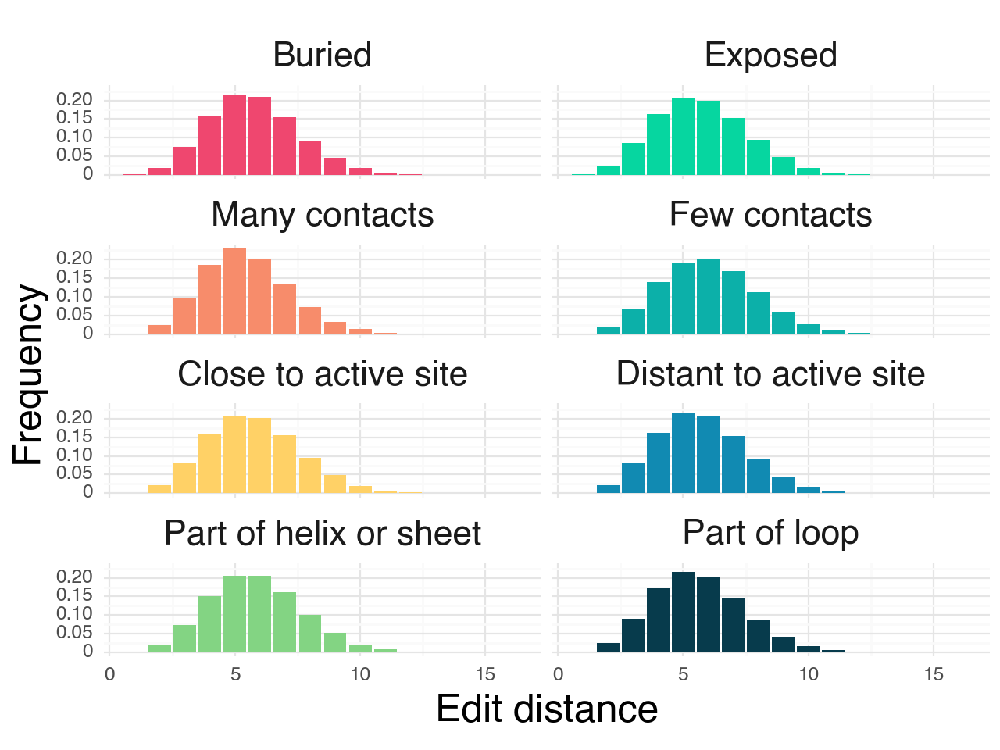

In [59]:
df = pd.read_csv(DATA_ROOT / "AMY_BACSU/grouped_levenshtein_distances.csv")
df["Structural characteristic"] = pd.Categorical(df["Structural characteristic"],
                                                     categories=["Buried", "Exposed", "Many contacts", "Few contacts",
                                                                 "Close to active site", "Distant to active site",
                                                                 "Part of helix or sheet", "Part of loop"],
                                                     ordered=True)
df["Frequency"] = df.groupby("Structural characteristic")["Count"].transform(lambda x: x / x.sum())
p = (
    p9.ggplot(df, p9.aes(x="Levenshtein distance", y="Frequency", fill="Structural characteristic"))
    + p9.geom_bar(stat="identity", position="dodge", show_legend=False)
    + p9.facet_wrap("Structural characteristic", ncol=2)
    + p9.theme_minimal()
    + p9.theme(
        axis_title_x=p9.element_text(text="Edit distance", size=18),
        axis_title_y=p9.element_text(text="Frequency", size=18),
        strip_text=p9.element_text(size=16)
    )
    + p9.scale_fill_manual(values=color_mapping)
)
p.save(save_dir / "levenshtein_distances.pdf")
print(p)

## Structural characteristic distribution per bin for combinatorial AMY_BACSU data

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 12 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/bin_distributions.pdf
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/themes/themeable.py:1902: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/themes/themeable.py:1902: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around

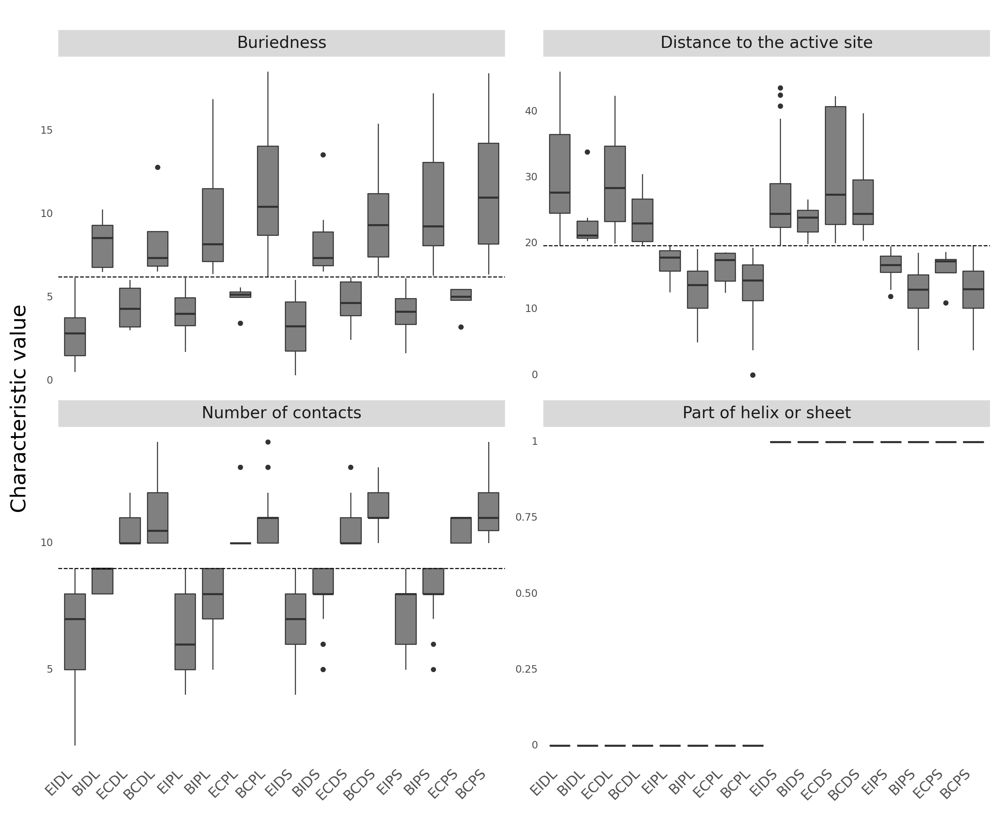

In [60]:
bin_distributions = pd.read_csv(DATA_ROOT / "AMY_BACSU/combinatorials/bin_distributions.csv")
bin_distributions["bin"] = pd.Categorical(bin_distributions["bin"])
structural_characteristics = pd.read_csv(DATA_ROOT / "AMY_BACSU/structural_characteristics.csv")

medians = get_characteristic_medians(structural_characteristics)
medians_df = pd.DataFrame({"variable": medians.keys(), "value": medians.values()})
bin_mappings =  get_bin_to_code_mappings(bin_distributions, medians)
bin_distributions["bin_characteristic_code"] = bin_distributions["bin"].map(bin_mappings)

fill_color = "grey"
p9.options.set_option("figure_size", (12, 10))
p = (
    p9.ggplot(bin_distributions, p9.aes(x="bin_characteristic_code", y="value"))
    + p9.geom_boxplot(fill=fill_color)
    + p9.theme(
        axis_ticks=p9.element_blank(),
        plot_background=p9.element_rect(fill="white"),
        panel_background=p9.element_rect(fill="white"),
        subplots_adjust={"wspace": 0.1},
        axis_text_x=p9.element_text(angle=45, hjust=1, size=12), 
        axis_title_y=p9.element_text(text="Characteristic value", size=18),
        strip_text=p9.element_text(size=14)
    )
    + p9.facet_wrap("~variable", nrow=2, ncol=2, scales="free_y")
    + p9.xlab("")
    #+ p9.ylab("Characteristic value")
    + p9.geom_hline(data=medians_df[medians_df["variable"] != "Part of helix or sheet"], mapping=p9.aes(yintercept="value"), linetype="dashed")
)
p.save(filename=save_dir / "bin_distributions.pdf")
p.draw()

## Regularization effect on augmented Potts and RITA regressor performance

## Potts

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 12 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/potts_regularization.pdf


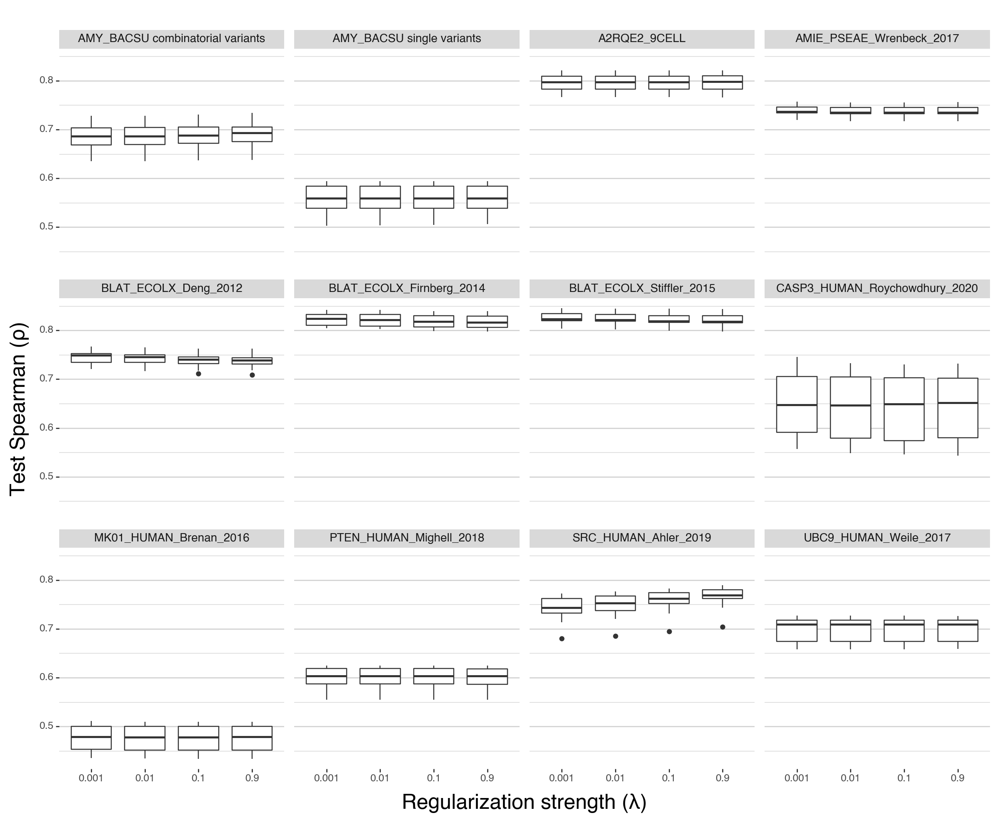

In [61]:
potts_results = pd.read_csv(PROJECT_ROOT / "results/regularization_effect/potts_results.csv")
potts_results["lambda_value"] = pd.Categorical(potts_results["lambda_value"])
potts_results["dataset"] = pd.Categorical(
    potts_results["dataset"],
    categories=[
        "AMY_BACSU/combinatorials",
        "AMY_BACSU/singles",
        "A2RQE2_9CELL",
        "AMIE_PSEAE_Wrenbeck_2017",
        "BLAT_ECOLX_Deng_2012",
        "BLAT_ECOLX_Firnberg_2014",
        "BLAT_ECOLX_Stiffler_2015",
        "CASP3_HUMAN_Roychowdhury_2020",
        "MK01_HUMAN_Brenan_2016",
        "PTEN_HUMAN_Mighell_2018",
        "SRC_HUMAN_Ahler_2019",
        "UBC9_HUMAN_Weile_2017",
    ]
)
potts_results["dataset"] = potts_results["dataset"].map(
    lambda x: "AMY_BACSU combinatorial variants" if x == "AMY_BACSU/combinatorials" else (
        "AMY_BACSU single variants" if x == "AMY_BACSU/singles" else x
    )
)
p = (
    p9.ggplot(potts_results, p9.aes(x="lambda_value", y="spearman"))
    + p9.facet_wrap("~dataset", ncol=4)  # Replace "class" with "dataset" in your case
    + p9.geom_boxplot()
    + p9.theme(
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
        axis_title_x=p9.element_text(text="Regularization strength (λ)", size=18),
        strip_text_x=p9.element_text(size=10),
        panel_grid_major=p9.element_line(colour="#d3d3d3"),
        panel_grid_minor=p9.element_line(colour="#d3d3d3"),
        panel_grid_major_x=p9.element_blank(),
        panel_background=p9.element_blank(),
    )
)
p.save(save_dir / "potts_regularization.pdf")
print(p)

/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 12 x 10 in image.
/Users/floris/work/phd/projects/mutation-predictability/conda_env/lib/python3.8/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/floris/work/phd/projects/mutation-predictability/results/figures/rita_regularization.pdf


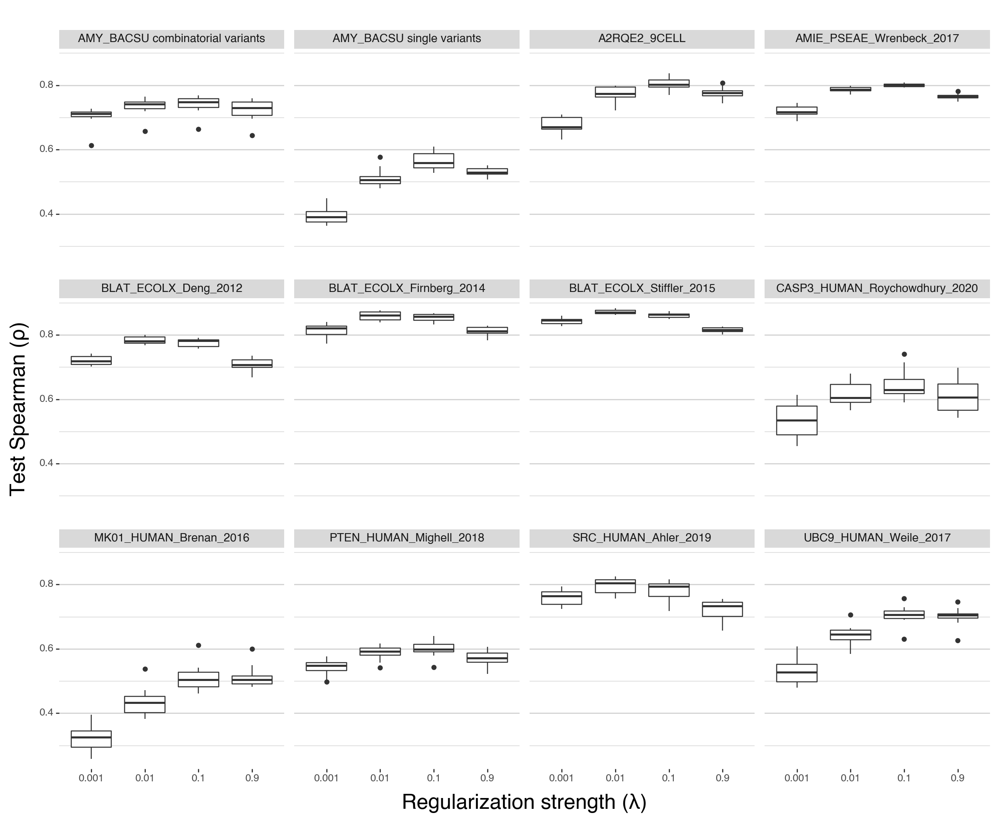

In [62]:
rita_results = pd.read_csv(PROJECT_ROOT / "results/regularization_effect/rita_results.csv")
rita_results["lambda_value"] = pd.Categorical(rita_results["lambda_value"])
rita_results["dataset"] = pd.Categorical(
    rita_results["dataset"],
    categories=[
        "AMY_BACSU/combinatorials",
        "AMY_BACSU/singles",
        "A2RQE2_9CELL",
        "AMIE_PSEAE_Wrenbeck_2017",
        "BLAT_ECOLX_Deng_2012",
        "BLAT_ECOLX_Firnberg_2014",
        "BLAT_ECOLX_Stiffler_2015",
        "CASP3_HUMAN_Roychowdhury_2020",
        "MK01_HUMAN_Brenan_2016",
        "PTEN_HUMAN_Mighell_2018",
        "SRC_HUMAN_Ahler_2019",
        "UBC9_HUMAN_Weile_2017",
    ]
)
rita_results["dataset"] = rita_results["dataset"].map(
    lambda x: "AMY_BACSU combinatorial variants" if x == "AMY_BACSU/combinatorials" else (
        "AMY_BACSU single variants" if x == "AMY_BACSU/singles" else x
    )
)
p = (
    p9.ggplot(rita_results, p9.aes(x="lambda_value", y="spearman"))
    + p9.facet_wrap("~dataset", ncol=4)  # Replace "class" with "dataset" in your case
    + p9.geom_boxplot()
    + p9.theme(
        axis_title_y=p9.element_text(text="Test Spearman (ρ)", size=18),
        axis_title_x=p9.element_text(text="Regularization strength (λ)", size=18),
        strip_text=p9.element_text(size=10),
        panel_grid_major=p9.element_line(colour="#d3d3d3"),
        panel_grid_minor=p9.element_line(colour="#d3d3d3"),
        panel_grid_major_x=p9.element_blank(),
        panel_background=p9.element_blank(),
    )
)
p.save(save_dir / "rita_regularization.pdf")
print(p)